# Vehicle Detection-Tracking
In this project, your goal is to write a software pipeline to identify vehicles in a video from a front-facing camera on a car.

## Load training data

In [1]:
import csv
import cv2
import glob
from os import listdir
import numpy as np
import matplotlib.pyplot as plt
import sklearn

VEHICLE_DATA_FOLDER = './data/vehicles'
NON_VEHICLE_DATA_FOLDER = './data/non-vehicles'

def load_data(data_folder):
    image_paths = glob.glob(data_folder + '/*.png')
    images = []
    for image_path in image_paths:
        images.append(image_path)
    return images

def load_all_data(data_folder):
    all_images = []
    for f in listdir(data_folder):
        images = load_data(data_folder + '/' + f)
        all_images+= images
    return all_images

# Load all vehicle image paths
vehicle_image_paths = load_all_data(VEHICLE_DATA_FOLDER)
print('Total vehicle images: ', len(vehicle_image_paths))

non_vehicle_image_paths = load_all_data(NON_VEHICLE_DATA_FOLDER)
print('Total non-vehicle images: ', len(non_vehicle_image_paths))

Total vehicle images:  8792
Total non-vehicle images:  8968


### Show some sample data

10 random vehicle images


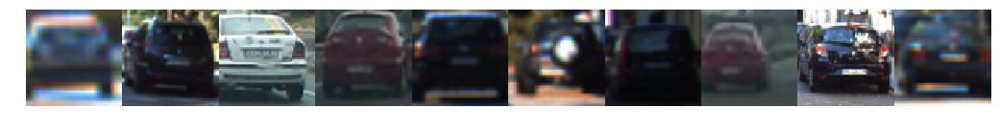

10 random non vehicle images


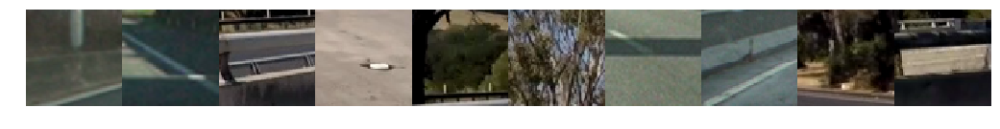

In [2]:
import matplotlib.image as mpimg
import random

SEED = 1501
random.seed(SEED)
# Try to show some images for testing
# Define the show_images function - show images for testing
def show_images(images, cols = 10, cmap=None):
    rows = (len(images)+1)//cols
    fig, axs = plt.subplots(rows,cols, figsize=(18, rows * 2))
    fig.subplots_adjust(hspace = .1, wspace=.001)
    axs = axs.ravel()
    for i, img in enumerate(images):
        axs[i].axis('off')
        if(len(img.shape) == 2):
            cmap = 'gray'
            axs[i].imshow(img.squeeze(), cmap)
        else:
            axs[i].imshow(img, cmap)
    plt.show()

def show3images(image1, title1, image2, title2, image3, title3):
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20,10))
    if (len(image1.shape) == 2):
        ax1.imshow(image1, cmap = 'gray')
    else:
        ax1.imshow(image1)
    ax1.set_title(title1, fontsize=30)
    if (len(image2.shape) == 2):
        ax2.imshow(image2, cmap = 'gray')
    else:
        ax2.imshow(image2)
    ax2.set_title(title2, fontsize=30)
    if (len(image3.shape) == 2):
        ax3.imshow(image3, cmap = 'gray')
    else:
        ax3.imshow(image3)
    ax3.set_title(title3, fontsize=30)
    plt.show()

def show2images(image1, title1, image2, title2):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    if (len(image1.shape) == 2):
        ax1.imshow(image1, cmap = 'gray')
    else:
        ax1.imshow(image1)
    ax1.set_title(title1, fontsize=30)
    if (len(image2.shape) == 2):
        ax2.imshow(image2, cmap = 'gray')
    else:
        ax2.imshow(image2)
    ax2.set_title(title2, fontsize=30)
    plt.show()
            
# Random vehicle indicies
random_vehicle_indicies = random.sample(range(0, len(vehicle_image_paths)), 10)
random_vehicle_images = []
for i in range(10):
    vehicle_image = mpimg.imread(vehicle_image_paths[random_vehicle_indicies[i]])
    random_vehicle_images.append(vehicle_image)
    
print('10 random vehicle images')
show_images(random_vehicle_images)

# Random non-vehicle indicies
random_non_vehicle_indicies = random.sample(range(0, len(non_vehicle_image_paths)), 10)
random_non_vehicle_images = []
for i in range(10):
    non_vehicle_image = mpimg.imread(non_vehicle_image_paths[random_non_vehicle_indicies[i]])
    random_non_vehicle_images.append(non_vehicle_image)
    
print('10 random non vehicle images')
show_images(random_non_vehicle_images)

## Histogram of Oriented Gradients (HOG)

### Extract HOG features
Use the scikit-image hog function to extract the HOG features of image. The hog function output depends on some important parameters such as orient, pixels_per_cell and cells_per_block. Below is the get_hog_feature() function from Udacity lession and some expirements on these parameters in order to select the best one.

In [3]:
from skimage.feature import hog

# Define a function to return HOG features and visualization
def get_hog_features(img, orient, pix_per_cell, cell_per_block, vis=False, feature_vec=True):
    if vis == True:
        features, hog_image = hog(img, orientations=orient, pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block), transform_sqrt=False, 
                                  visualise=True, feature_vector=False)
        return features, hog_image
    else:      
        features = hog(img, orientations=orient, pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block), transform_sqrt=False, 
                       visualise=False, feature_vector=feature_vec)
        return features

#### Play around with orient parameter

After try to explore the orient parameter values 7,9,11 with pix_per_cell=8 and cell_per_block=2, I choose the orient=9 because it gives the most clear shape of the car.

C:\Users\htang\AppData\Local\Continuum\Anaconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


Random 10 vehicle images


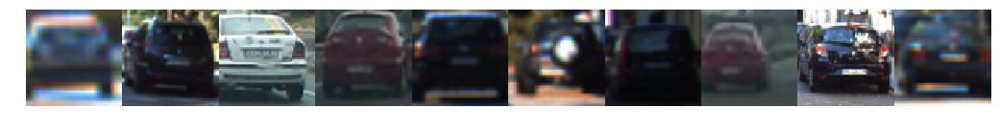

Orient=9 pix_per_cell=8 cell_per_block=2


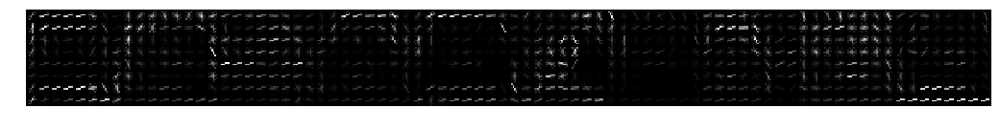

Orient=7 pix_per_cell=8 cell_per_block=2


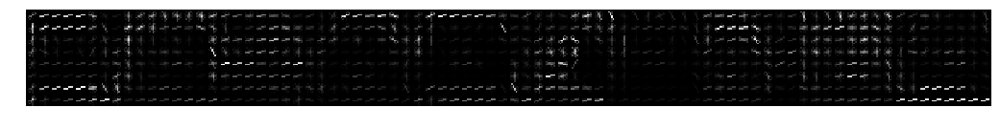

Orient=11 pix_per_cell=8 cell_per_block=2


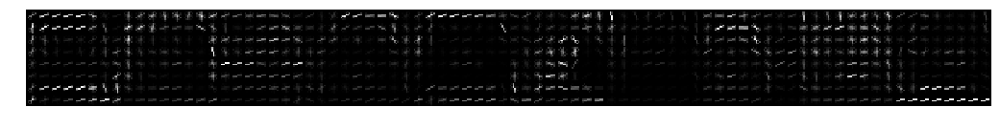

Random 10 Non vehicle images


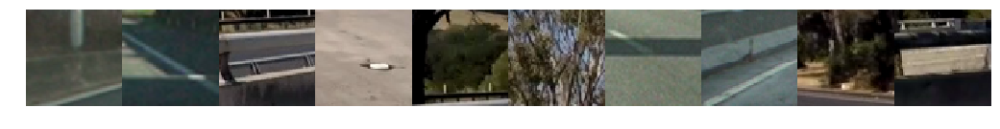

Orient=9 pix_per_cell=8 cell_per_block=2


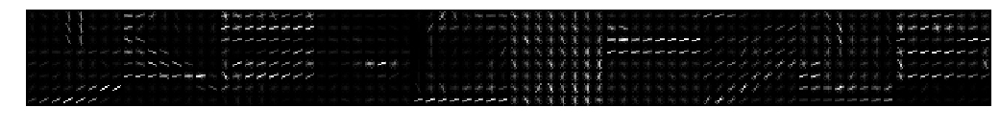

Orient=7 pix_per_cell=8 cell_per_block=2


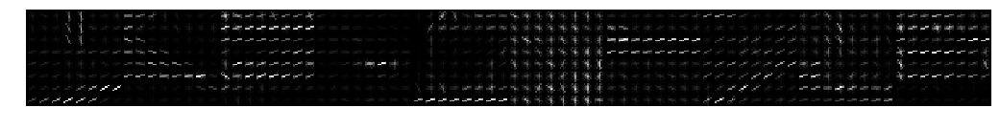

Orient=11 pix_per_cell=8 cell_per_block=2


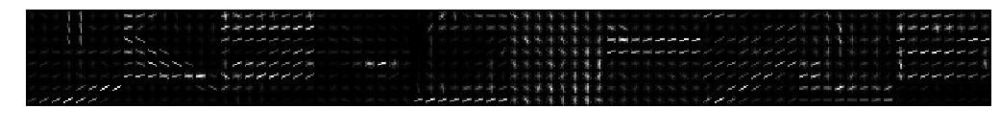

In [4]:
orient = 9
pix_per_cell = 8
cell_per_block = 2
debug = True
v_hog_images1 = []
v_hog_images2 = []
v_hog_images3 = []
# Try on the vehicle images
for image in random_vehicle_images:
    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    features1, hog_image1 = get_hog_features(gray, orient = 9, 
                        pix_per_cell = 8, cell_per_block = 2, 
                        vis=True, feature_vec=False)
    v_hog_images1.append(hog_image1)
    features2, hog_image2 = get_hog_features(gray, orient = 7, 
                        pix_per_cell = 8, cell_per_block = 2, 
                        vis=True, feature_vec=False)
    v_hog_images2.append(hog_image2)
    features3, hog_image3 = get_hog_features(gray, orient = 11, 
                        pix_per_cell = 8, cell_per_block = 2, 
                        vis=True, feature_vec=False)
    v_hog_images3.append(hog_image3)
    
print('Random 10 vehicle images')
show_images(random_vehicle_images)
print('Orient=9 pix_per_cell=8 cell_per_block=2')
show_images(v_hog_images1)
print('Orient=7 pix_per_cell=8 cell_per_block=2')
show_images(v_hog_images2)
print('Orient=11 pix_per_cell=8 cell_per_block=2')
show_images(v_hog_images3)

nv_hog_images1 = []
nv_hog_images2 = []
nv_hog_images3 = []

# Try on the vehicle images
for image in random_non_vehicle_images:
    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    features1, hog_image1 = get_hog_features(gray, orient = 9, 
                        pix_per_cell = 8, cell_per_block = 2, 
                        vis=True, feature_vec=False)
    nv_hog_images1.append(hog_image1)
    features2, hog_image2 = get_hog_features(gray, orient = 7, 
                        pix_per_cell = 8, cell_per_block = 2, 
                        vis=True, feature_vec=False)
    nv_hog_images2.append(hog_image2)
    features3, hog_image3 = get_hog_features(gray, orient = 11, 
                        pix_per_cell = 8, cell_per_block = 2, 
                        vis=True, feature_vec=False)
    nv_hog_images3.append(hog_image3)
print('Random 10 Non vehicle images')
show_images(random_non_vehicle_images)
print('Orient=9 pix_per_cell=8 cell_per_block=2')
show_images(nv_hog_images1)
print('Orient=7 pix_per_cell=8 cell_per_block=2')
show_images(nv_hog_images2)
print('Orient=11 pix_per_cell=8 cell_per_block=2')
show_images(nv_hog_images3)

#### Experiment on pix_per_cell parameter

Let's keep the orient=9 and cell_per_block=2 and try to some experiments on pix_per_cell parameter with values 6,8 and 10. From the result, I see the pix_per_cell=8 gives the most clear output. So I choose orient=9, pix_per_cell=8 and cell_per_block=2.

C:\Users\htang\AppData\Local\Continuum\Anaconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


Random 10 vehicle images


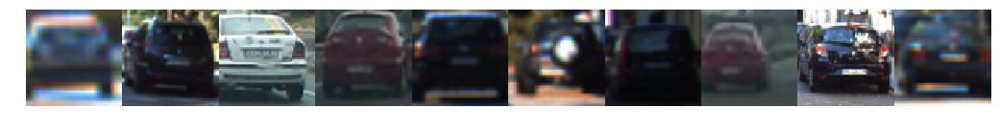

Orient=9 pix_per_cell=8 cell_per_block=2


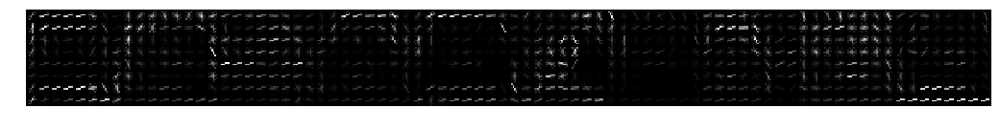

Orient=9 pix_per_cell=6 cell_per_block=2


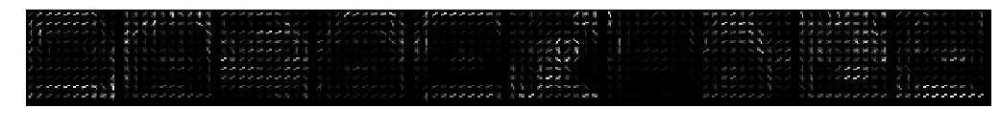

Orient=9 pix_per_cell=10 cell_per_block=2


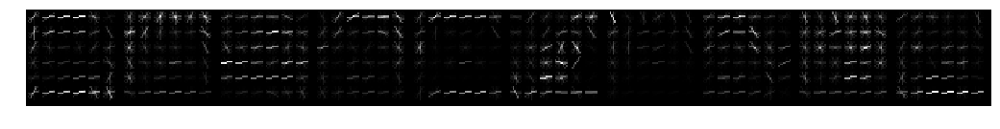

Random 10 Non vehicle images


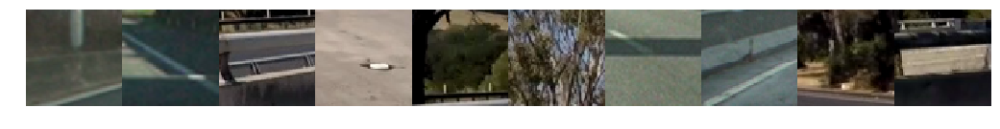

Orient=9 pix_per_cell=8 cell_per_block=2


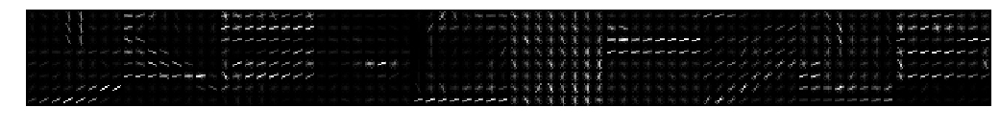

Orient=9 pix_per_cell=6 cell_per_block=2


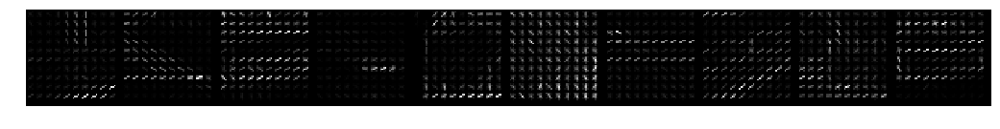

Orient=9 pix_per_cell=10 cell_per_block=2


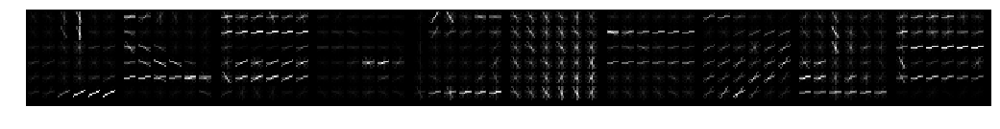

Done


In [5]:
orient = 9
pix_per_cell = 8
cell_per_block = 2
debug = True
v_hog_images1 = []
v_hog_images2 = []
v_hog_images3 = []
# Try on the vehicle images
for image in random_vehicle_images:
    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    features1, hog_image1 = get_hog_features(gray, orient = 9, 
                        pix_per_cell = 8, cell_per_block = 2, 
                        vis=True, feature_vec=False)
    v_hog_images1.append(hog_image1)
    features2, hog_image2 = get_hog_features(gray, orient = 9, 
                        pix_per_cell = 6, cell_per_block = 2, 
                        vis=True, feature_vec=False)
    v_hog_images2.append(hog_image2)
    features3, hog_image3 = get_hog_features(gray, orient = 9, 
                        pix_per_cell = 10, cell_per_block = 2, 
                        vis=True, feature_vec=False)
    v_hog_images3.append(hog_image3)
    
print('Random 10 vehicle images')
show_images(random_vehicle_images)
print('Orient=9 pix_per_cell=8 cell_per_block=2')
show_images(v_hog_images1)
print('Orient=9 pix_per_cell=6 cell_per_block=2')
show_images(v_hog_images2)
print('Orient=9 pix_per_cell=10 cell_per_block=2')
show_images(v_hog_images3)

nv_hog_images1 = []
nv_hog_images2 = []
nv_hog_images3 = []

# Try on the vehicle images
for image in random_non_vehicle_images:
    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    features1, hog_image1 = get_hog_features(gray, orient = 9, 
                        pix_per_cell = 8, cell_per_block = 2, 
                        vis=True, feature_vec=False)
    nv_hog_images1.append(hog_image1)
    features2, hog_image2 = get_hog_features(gray, orient = 9, 
                        pix_per_cell = 6, cell_per_block = 2, 
                        vis=True, feature_vec=False)
    nv_hog_images2.append(hog_image2)
    features3, hog_image3 = get_hog_features(gray, orient = 9, 
                        pix_per_cell = 10, cell_per_block = 2, 
                        vis=True, feature_vec=False)
    nv_hog_images3.append(hog_image3)
print('Random 10 Non vehicle images')
show_images(random_non_vehicle_images)
print('Orient=9 pix_per_cell=8 cell_per_block=2')
show_images(nv_hog_images1)
print('Orient=9 pix_per_cell=6 cell_per_block=2')
show_images(nv_hog_images2)
print('Orient=9 pix_per_cell=10 cell_per_block=2')
show_images(nv_hog_images3)
print('Done')

### HOG features and color space

In order to get the better result, I try to explore HOG features on the different color spaces. From the experiment result, I see there is no much different on HOG features between color spaces.

C:\Users\htang\AppData\Local\Continuum\Anaconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


Original images


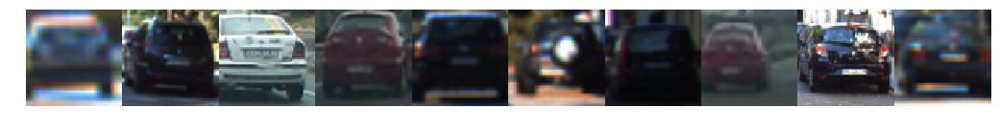

Hog H channel


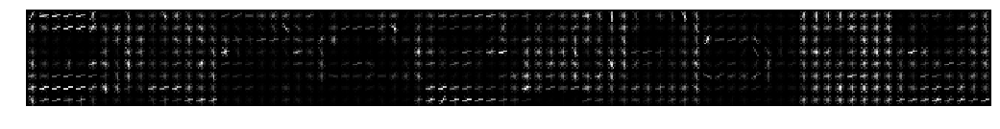

Hog S channel


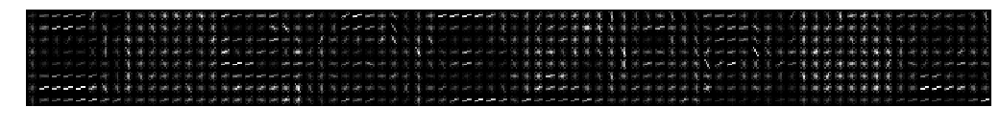

Hog V channel


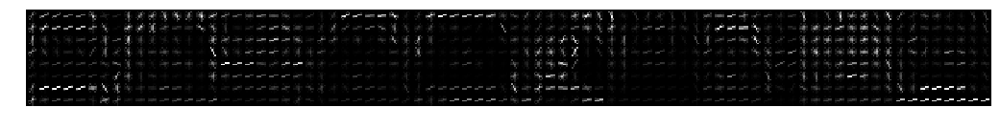

Original non vehicle images


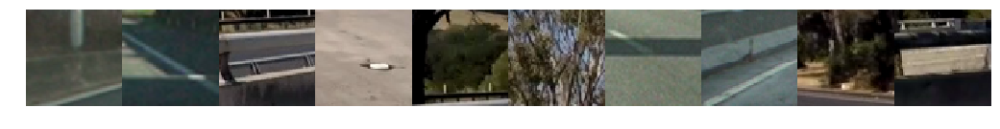

Hog H channel


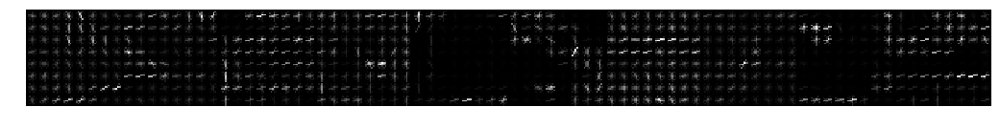

Hog S channel


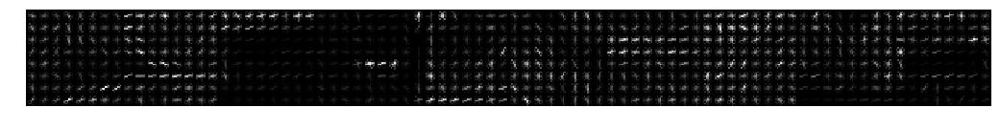

Hog V channel


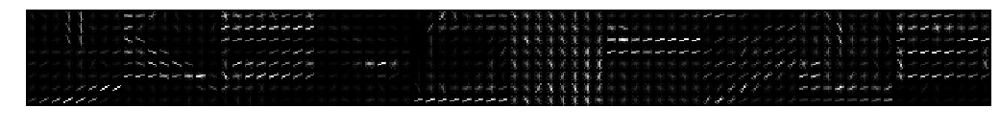

Done


In [6]:
def convert_color(img, color_space='RGB'):
    if color_space != 'RGB':
        if color_space == 'HSV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        elif color_space == 'LUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
        elif color_space == 'HLS':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
        elif color_space == 'YUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
        elif color_space == 'YCrCb':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    else: feature_image = np.copy(img)
    return feature_image
v_hog_images0 = []
v_hog_images1 = []
v_hog_images2 = []
# Try with HSV color space HOG features
for image in random_vehicle_images:
    hsv = convert_color(image, color_space='HSV')
    hog_features0, hog_image0 = get_hog_features(hsv[:,:,0], orient = 9, 
                        pix_per_cell = 8, cell_per_block = 2, vis=True, feature_vec=True)
    v_hog_images0.append(hog_image0)
    hog_features1, hog_image1 = get_hog_features(hsv[:,:,1], orient = 9, 
                        pix_per_cell = 8, cell_per_block = 2, vis=True, feature_vec=True)
    v_hog_images1.append(hog_image1)
    hog_features2, hog_image2 = get_hog_features(hsv[:,:,2], orient = 9, 
                        pix_per_cell = 8, cell_per_block = 2, vis=True, feature_vec=True)
    v_hog_images2.append(hog_image2)
    
print('Original images')
show_images(random_vehicle_images)
print('Hog H channel')
show_images(v_hog_images0)
print('Hog S channel')
show_images(v_hog_images1)
print('Hog V channel')
show_images(v_hog_images2)

nv_hog_images0 = []
nv_hog_images1 = []
nv_hog_images2 = []
# Try with HSV color space HOG features
for image in random_non_vehicle_images:
    hsv = convert_color(image, color_space='HSV')
    hog_features0, hog_image0 = get_hog_features(hsv[:,:,0], orient = 9, 
                        pix_per_cell = 8, cell_per_block = 2, vis=True, feature_vec=True)
    nv_hog_images0.append(hog_image0)
    hog_features1, hog_image1 = get_hog_features(hsv[:,:,1], orient = 9, 
                        pix_per_cell = 8, cell_per_block = 2, vis=True, feature_vec=True)
    nv_hog_images1.append(hog_image1)
    hog_features2, hog_image2 = get_hog_features(hsv[:,:,2], orient = 9, 
                        pix_per_cell = 8, cell_per_block = 2, vis=True, feature_vec=True)
    nv_hog_images2.append(hog_image2)
    
print('Original non vehicle images')
show_images(random_non_vehicle_images)
print('Hog H channel')
show_images(nv_hog_images0)
print('Hog S channel')
show_images(nv_hog_images1)
print('Hog V channel')
show_images(nv_hog_images2)
print('Done')

C:\Users\htang\AppData\Local\Continuum\Anaconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


Original images


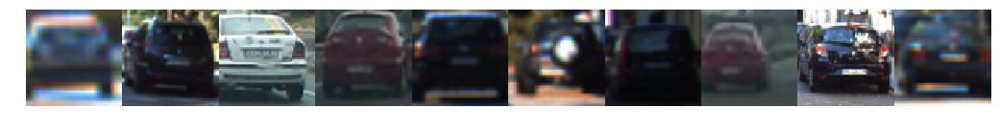

Hog L channel


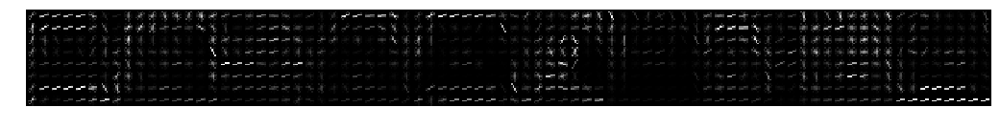

Hog U channel


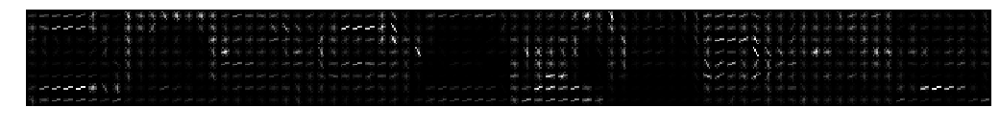

Hog V channel


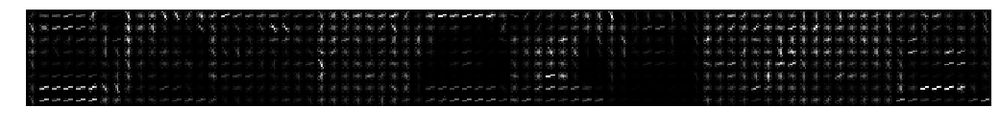

Original non vehicle images


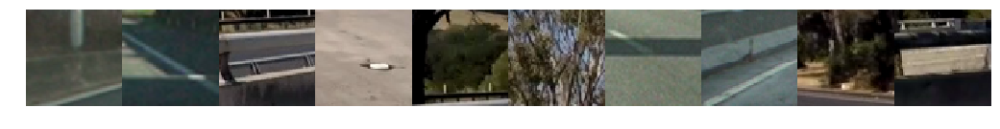

Hog L channel


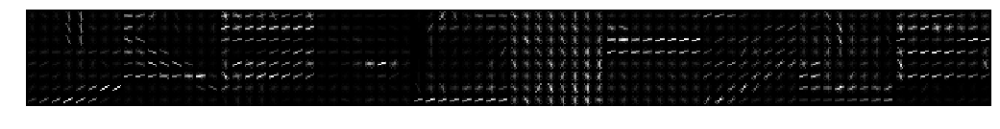

Hog U channel


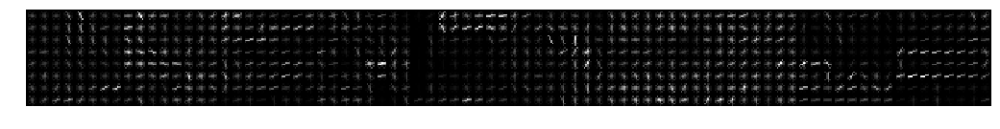

Hog V channel


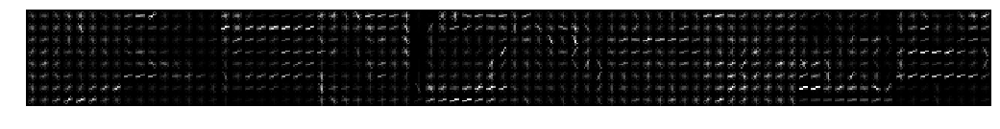

Done


In [7]:
v_hog_images0 = []
v_hog_images1 = []
v_hog_images2 = []
# Try with HSV color space HOG features
for image in random_vehicle_images:
    hsv = convert_color(image, color_space='LUV')
    hog_features0, hog_image0 = get_hog_features(hsv[:,:,0], orient = 9, 
                        pix_per_cell = 8, cell_per_block = 2, vis=True, feature_vec=True)
    v_hog_images0.append(hog_image0)
    hog_features1, hog_image1 = get_hog_features(hsv[:,:,1], orient = 9, 
                        pix_per_cell = 8, cell_per_block = 2, vis=True, feature_vec=True)
    v_hog_images1.append(hog_image1)
    hog_features2, hog_image2 = get_hog_features(hsv[:,:,2], orient = 9, 
                        pix_per_cell = 8, cell_per_block = 2, vis=True, feature_vec=True)
    v_hog_images2.append(hog_image2)
    
print('Original images')
show_images(random_vehicle_images)
print('Hog L channel')
show_images(v_hog_images0)
print('Hog U channel')
show_images(v_hog_images1)
print('Hog V channel')
show_images(v_hog_images2)

nv_hog_images0 = []
nv_hog_images1 = []
nv_hog_images2 = []
# Try with HSV color space HOG features
for image in random_non_vehicle_images:
    hsv = convert_color(image, color_space='LUV')
    hog_features0, hog_image0 = get_hog_features(hsv[:,:,0], orient = 9, 
                        pix_per_cell = 8, cell_per_block = 2, vis=True, feature_vec=True)
    nv_hog_images0.append(hog_image0)
    hog_features1, hog_image1 = get_hog_features(hsv[:,:,1], orient = 9, 
                        pix_per_cell = 8, cell_per_block = 2, vis=True, feature_vec=True)
    nv_hog_images1.append(hog_image1)
    hog_features2, hog_image2 = get_hog_features(hsv[:,:,2], orient = 9, 
                        pix_per_cell = 8, cell_per_block = 2, vis=True, feature_vec=True)
    nv_hog_images2.append(hog_image2)
    
print('Original non vehicle images')
show_images(random_non_vehicle_images)
print('Hog L channel')
show_images(nv_hog_images0)
print('Hog U channel')
show_images(nv_hog_images1)
print('Hog V channel')
show_images(nv_hog_images2)
print('Done')

C:\Users\htang\AppData\Local\Continuum\Anaconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


Original images


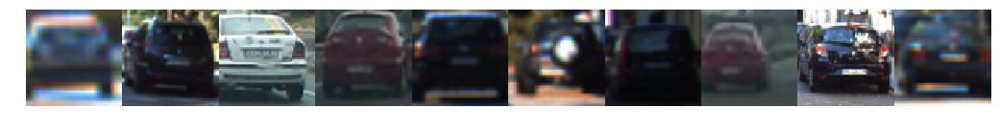

Hog H channel


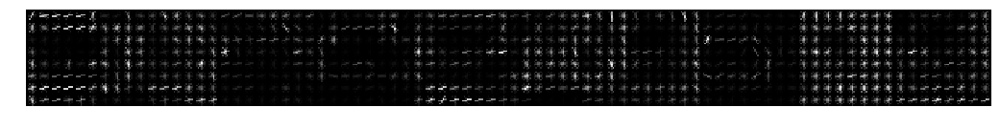

Hog L channel


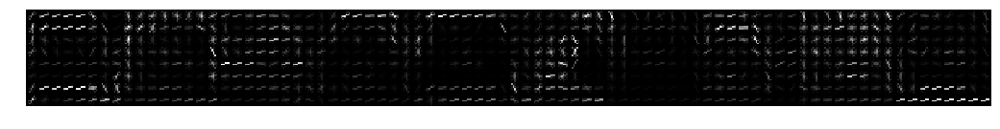

Hog S channel


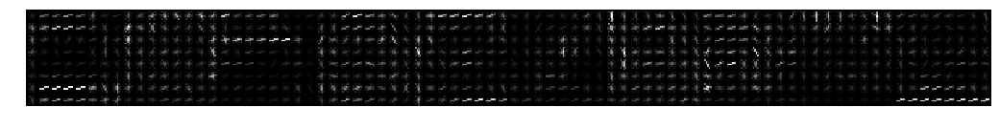

Original non vehicle images


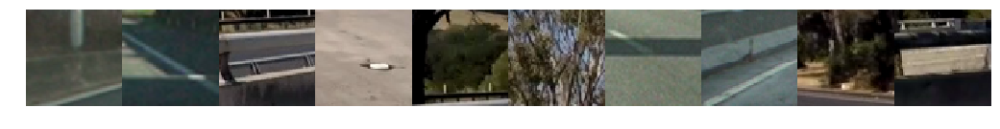

Hog H channel


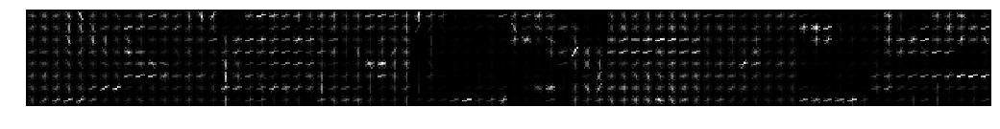

Hog L channel


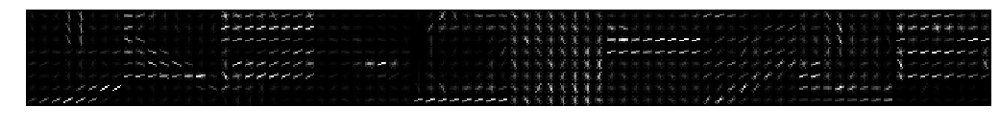

Hog S channel


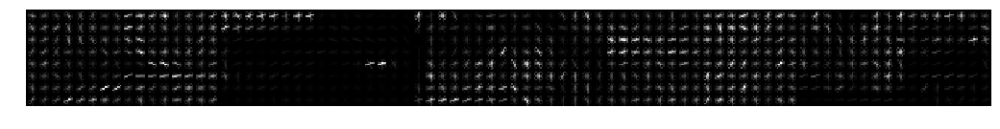

Done


In [8]:
v_hog_images0 = []
v_hog_images1 = []
v_hog_images2 = []
# Try with HSV color space HOG features
for image in random_vehicle_images:
    hsv = convert_color(image, color_space='HLS')
    hog_features0, hog_image0 = get_hog_features(hsv[:,:,0], orient = 9, 
                        pix_per_cell = 8, cell_per_block = 2, vis=True, feature_vec=True)
    v_hog_images0.append(hog_image0)
    hog_features1, hog_image1 = get_hog_features(hsv[:,:,1], orient = 9, 
                        pix_per_cell = 8, cell_per_block = 2, vis=True, feature_vec=True)
    v_hog_images1.append(hog_image1)
    hog_features2, hog_image2 = get_hog_features(hsv[:,:,2], orient = 9, 
                        pix_per_cell = 8, cell_per_block = 2, vis=True, feature_vec=True)
    v_hog_images2.append(hog_image2)
    
print('Original images')
show_images(random_vehicle_images)
print('Hog H channel')
show_images(v_hog_images0)
print('Hog L channel')
show_images(v_hog_images1)
print('Hog S channel')
show_images(v_hog_images2)

nv_hog_images0 = []
nv_hog_images1 = []
nv_hog_images2 = []
# Try with HSV color space HOG features
for image in random_non_vehicle_images:
    hsv = convert_color(image, color_space='HLS')
    hog_features0, hog_image0 = get_hog_features(hsv[:,:,0], orient = 9, 
                        pix_per_cell = 8, cell_per_block = 2, vis=True, feature_vec=True)
    nv_hog_images0.append(hog_image0)
    hog_features1, hog_image1 = get_hog_features(hsv[:,:,1], orient = 9, 
                        pix_per_cell = 8, cell_per_block = 2, vis=True, feature_vec=True)
    nv_hog_images1.append(hog_image1)
    hog_features2, hog_image2 = get_hog_features(hsv[:,:,2], orient = 9, 
                        pix_per_cell = 8, cell_per_block = 2, vis=True, feature_vec=True)
    nv_hog_images2.append(hog_image2)
    
print('Original non vehicle images')
show_images(random_non_vehicle_images)
print('Hog H channel')
show_images(nv_hog_images0)
print('Hog L channel')
show_images(nv_hog_images1)
print('Hog S channel')
show_images(nv_hog_images2)
print('Done')

C:\Users\htang\AppData\Local\Continuum\Anaconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


Original images


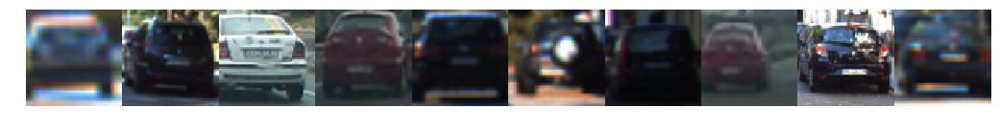

Hog Y channel


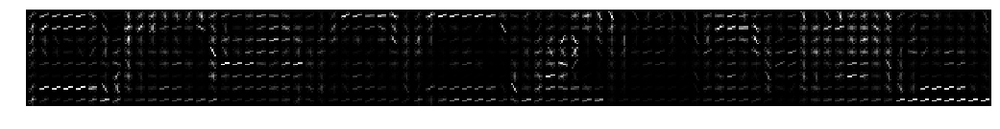

Hog U channel


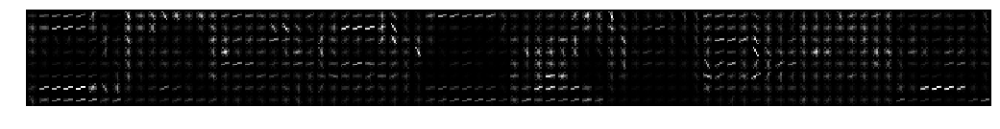

Hog V channel


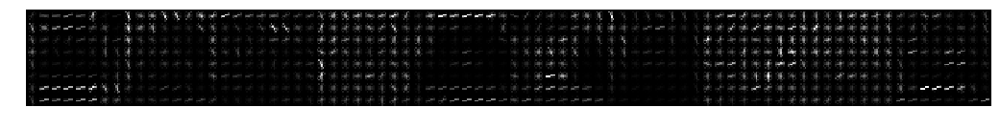

Original non vehicle images


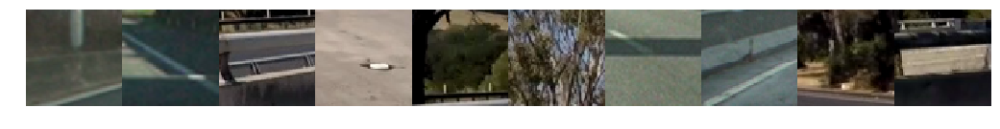

Hog Y channel


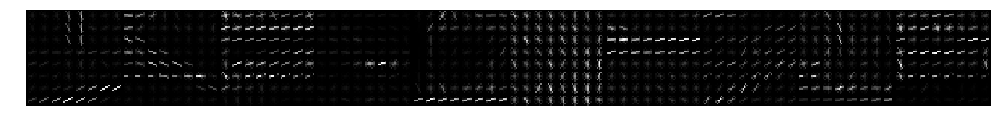

Hog U channel


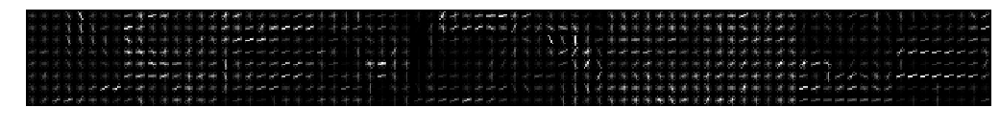

Hog V channel


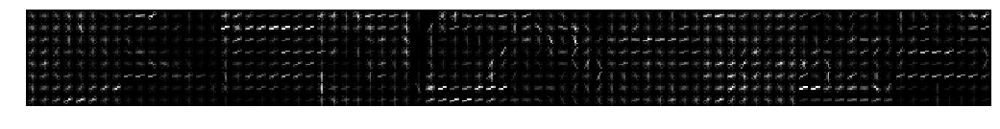

Done


In [9]:
v_hog_images0 = []
v_hog_images1 = []
v_hog_images2 = []
# Try with HSV color space HOG features
for image in random_vehicle_images:
    hsv = convert_color(image, color_space='YUV')
    hog_features0, hog_image0 = get_hog_features(hsv[:,:,0], orient = 9, 
                        pix_per_cell = 8, cell_per_block = 2, vis=True, feature_vec=True)
    v_hog_images0.append(hog_image0)
    hog_features1, hog_image1 = get_hog_features(hsv[:,:,1], orient = 9, 
                        pix_per_cell = 8, cell_per_block = 2, vis=True, feature_vec=True)
    v_hog_images1.append(hog_image1)
    hog_features2, hog_image2 = get_hog_features(hsv[:,:,2], orient = 9, 
                        pix_per_cell = 8, cell_per_block = 2, vis=True, feature_vec=True)
    v_hog_images2.append(hog_image2)
    
print('Original images')
show_images(random_vehicle_images)
print('Hog Y channel')
show_images(v_hog_images0)
print('Hog U channel')
show_images(v_hog_images1)
print('Hog V channel')
show_images(v_hog_images2)

nv_hog_images0 = []
nv_hog_images1 = []
nv_hog_images2 = []
# Try with HSV color space HOG features
for image in random_non_vehicle_images:
    hsv = convert_color(image, color_space='YUV')
    hog_features0, hog_image0 = get_hog_features(hsv[:,:,0], orient = 9, 
                        pix_per_cell = 8, cell_per_block = 2, vis=True, feature_vec=True)
    nv_hog_images0.append(hog_image0)
    hog_features1, hog_image1 = get_hog_features(hsv[:,:,1], orient = 9, 
                        pix_per_cell = 8, cell_per_block = 2, vis=True, feature_vec=True)
    nv_hog_images1.append(hog_image1)
    hog_features2, hog_image2 = get_hog_features(hsv[:,:,2], orient = 9, 
                        pix_per_cell = 8, cell_per_block = 2, vis=True, feature_vec=True)
    nv_hog_images2.append(hog_image2)
    
print('Original non vehicle images')
show_images(random_non_vehicle_images)
print('Hog Y channel')
show_images(nv_hog_images0)
print('Hog U channel')
show_images(nv_hog_images1)
print('Hog V channel')
show_images(nv_hog_images2)
print('Done')

C:\Users\htang\AppData\Local\Continuum\Anaconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


Original images


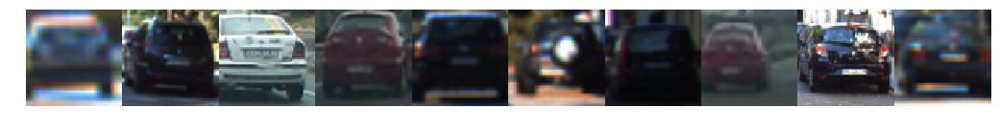

Hog Y channel


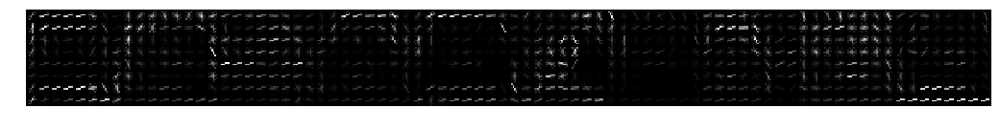

Hog Cr channel


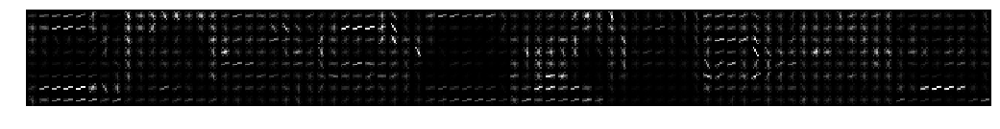

Hog Cb channel


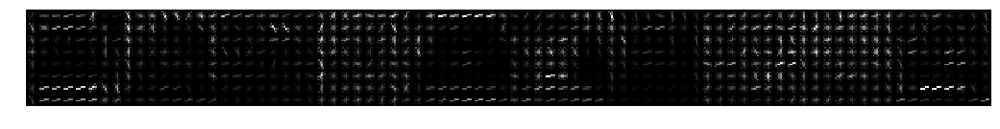

Original non vehicle images


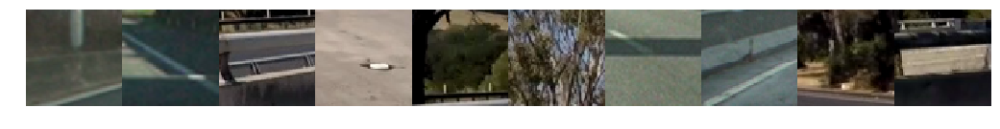

Hog Y channel


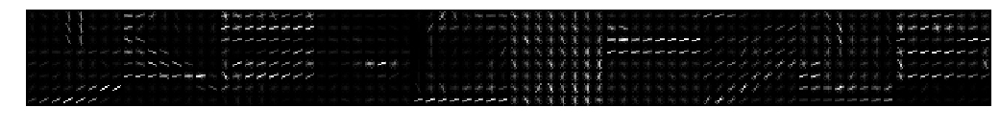

Hog Cr channel


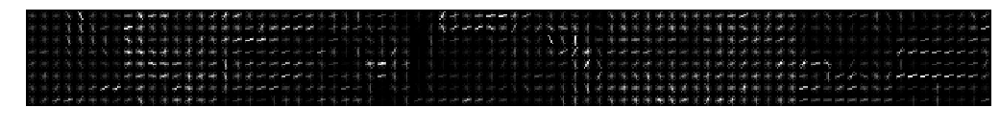

Hog Cb channel


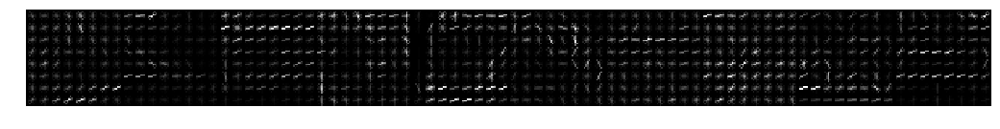

Done


In [10]:
v_hog_images0 = []
v_hog_images1 = []
v_hog_images2 = []
# Try with HSV color space HOG features
for image in random_vehicle_images:
    hsv = convert_color(image, color_space='YCrCb')
    hog_features0, hog_image0 = get_hog_features(hsv[:,:,0], orient = 9, 
                        pix_per_cell = 8, cell_per_block = 2, vis=True, feature_vec=True)
    v_hog_images0.append(hog_image0)
    hog_features1, hog_image1 = get_hog_features(hsv[:,:,1], orient = 9, 
                        pix_per_cell = 8, cell_per_block = 2, vis=True, feature_vec=True)
    v_hog_images1.append(hog_image1)
    hog_features2, hog_image2 = get_hog_features(hsv[:,:,2], orient = 9, 
                        pix_per_cell = 8, cell_per_block = 2, vis=True, feature_vec=True)
    v_hog_images2.append(hog_image2)
    
print('Original images')
show_images(random_vehicle_images)
print('Hog Y channel')
show_images(v_hog_images0)
print('Hog Cr channel')
show_images(v_hog_images1)
print('Hog Cb channel')
show_images(v_hog_images2)

nv_hog_images0 = []
nv_hog_images1 = []
nv_hog_images2 = []
# Try with HSV color space HOG features
for image in random_non_vehicle_images:
    hsv = convert_color(image, color_space='YCrCb')
    hog_features0, hog_image0 = get_hog_features(hsv[:,:,0], orient = 9, 
                        pix_per_cell = 8, cell_per_block = 2, vis=True, feature_vec=True)
    nv_hog_images0.append(hog_image0)
    hog_features1, hog_image1 = get_hog_features(hsv[:,:,1], orient = 9, 
                        pix_per_cell = 8, cell_per_block = 2, vis=True, feature_vec=True)
    nv_hog_images1.append(hog_image1)
    hog_features2, hog_image2 = get_hog_features(hsv[:,:,2], orient = 9, 
                        pix_per_cell = 8, cell_per_block = 2, vis=True, feature_vec=True)
    nv_hog_images2.append(hog_image2)
    
print('Original non vehicle images')
show_images(random_non_vehicle_images)
print('Hog Y channel')
show_images(nv_hog_images0)
print('Hog Cr channel')
show_images(nv_hog_images1)
print('Hog Cb channel')
show_images(nv_hog_images2)
print('Done')

### Histogram of color

Let's try to explore the histogram of color on some different color spaces. From the result, I see the histogram on LUV color space give the best result with the clear different between the non vehicle and vehicle histogram.

In [11]:
# Define a function to compute color histogram features  
def color_hist(img, nbins=32, bins_range=(0, 256)):
    # Compute the histogram of the color channels separately
    channel1_hist = np.histogram(img[:,:,0], bins=nbins, range=bins_range)
    channel2_hist = np.histogram(img[:,:,1], bins=nbins, range=bins_range)
    channel3_hist = np.histogram(img[:,:,2], bins=nbins, range=bins_range)
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    # Return the individual histograms, bin_centers and feature vector
    return hist_features
# Try to show some images for testing
# Define the show_images function - show images for testing
def plot_images(images, cols = 10):
    rows = (len(images)+1)//cols
    fig, axs = plt.subplots(rows,cols, figsize=(18, rows * 2))
    fig.subplots_adjust(hspace = .1, wspace=.001)
    axs = axs.ravel()
    for i, img in enumerate(images):
        axs[i].axis('off')
        axs[i].plot(img)
    plt.show()

print('Done')

Done


Original vehicle images


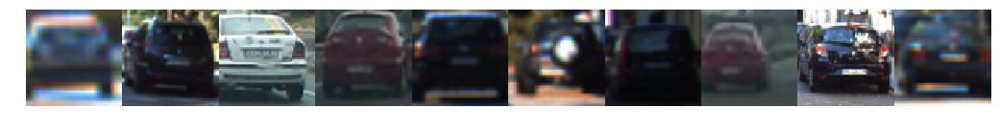

Original non vehicle images


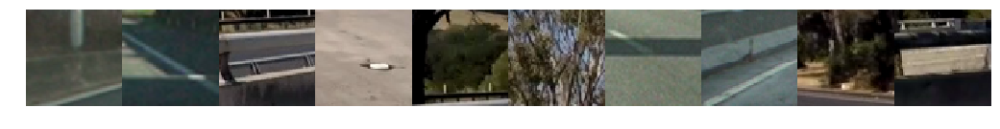

HSV vechile Dist


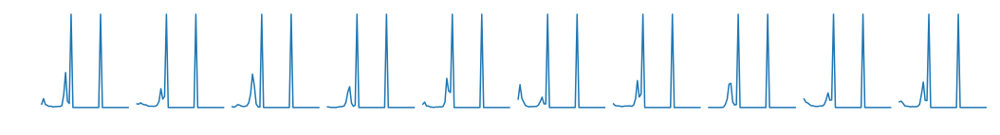

HSV Non vehicle Dist


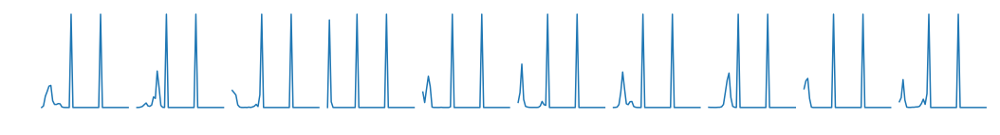

LUV Vehicle Dist


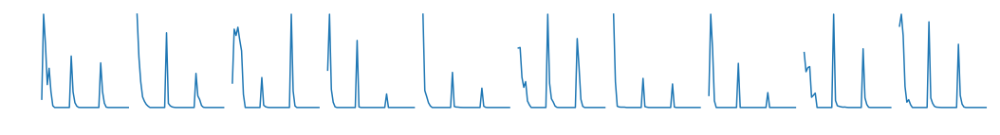

LUV Non Vehicle Dist


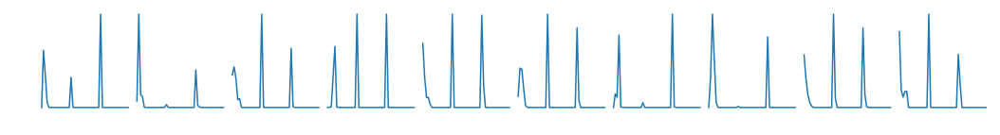

YUV Vehicle Dist


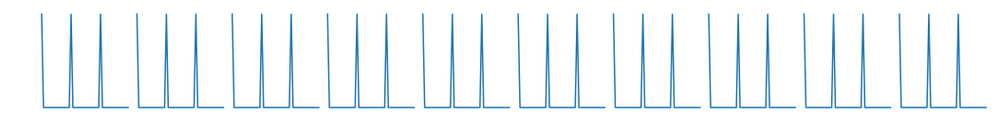

YUV Non Vehicle Dist


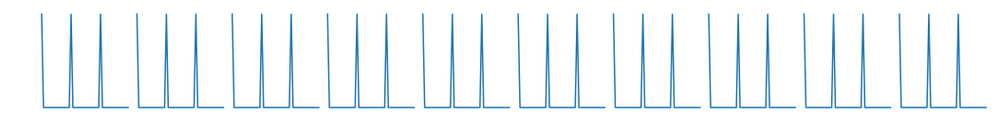

YCrCb Vehicle Dist


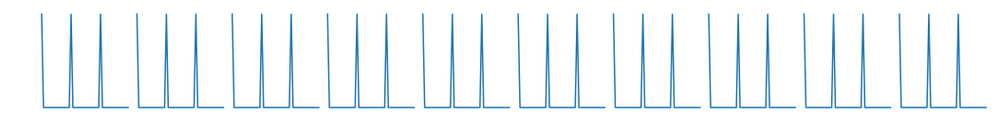

YCrCb Non Vehicle Dist


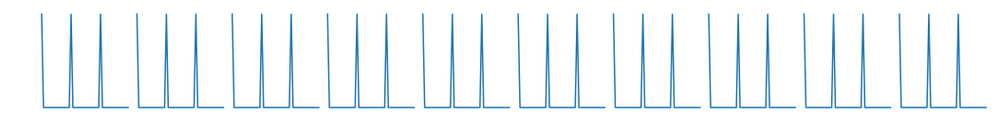

Done


In [12]:
hsv_hists = []
luv_hists = []
yuv_hists = []
ycrcb_hists = []

for image in random_vehicle_images:
    hsv = convert_color(image, color_space='HSV')
    hsv_hist = color_hist(hsv, nbins=16)
    luv = convert_color(image, color_space='LUV')
    luv_hist = color_hist(luv, nbins=16)
    yuv = convert_color(image, color_space='YUV')
    yuv_hist = color_hist(yuv, nbins=16)
    ycrcb = convert_color(image, color_space='YCrCb')
    ycrcb_hist = color_hist(ycrcb, nbins=16)
    
    hsv_hists.append(hsv_hist)
    luv_hists.append(luv_hist)
    yuv_hists.append(yuv_hist)
    ycrcb_hists.append(ycrcb_hist)

nhsv_hists = []
nluv_hists = []
nyuv_hists = []
nycrcb_hists = []

for image in random_non_vehicle_images:
    hsv = convert_color(image, color_space='HSV')
    nhsv_hist = color_hist(hsv, nbins=16)
    luv = convert_color(image, color_space='LUV')
    nluv_hist = color_hist(luv, nbins=16)
    yuv = convert_color(image, color_space='YUV')
    nyuv_hist = color_hist(yuv, nbins=16)
    ycrcb = convert_color(image, color_space='YCrCb')
    nycrcb_hist = color_hist(ycrcb, nbins=16)
    
    nhsv_hists.append(nhsv_hist)
    nluv_hists.append(nluv_hist)
    nyuv_hists.append(nyuv_hist)
    nycrcb_hists.append(nycrcb_hist)
print('Original vehicle images')
show_images(random_vehicle_images)
print('Original non vehicle images')
show_images(random_non_vehicle_images)
print('HSV vechile Dist')
plot_images(hsv_hists)
print('HSV Non vehicle Dist')
plot_images(nhsv_hists)
print('LUV Vehicle Dist')
plot_images(luv_hists)
print('LUV Non Vehicle Dist')
plot_images(nluv_hists)
print('YUV Vehicle Dist')
plot_images(yuv_hists)
print('YUV Non Vehicle Dist')
plot_images(nyuv_hists)
print('YCrCb Vehicle Dist')
plot_images(ycrcb_hists)
print('YCrCb Non Vehicle Dist')
plot_images(nycrcb_hists)
print('Done')

### Spatial Binning of Color
You can perform spatial binning on an image and still retain enough information to help in finding vehicles. Let's try to explore the spatial binning of color on some different color spaces. I see the LUV and YUV color spaces give a good result to distinguish between vehicle and non vehicle images.

In [13]:
# Define a function to compute binned color features  
def bin_spatial(img, size=(32, 32)):
    # Use cv2.resize().ravel() to create the feature vector
    features = cv2.resize(img, size).ravel() 
    # Return the feature vector
    return features
print('Done')

Done


Original vehicle images


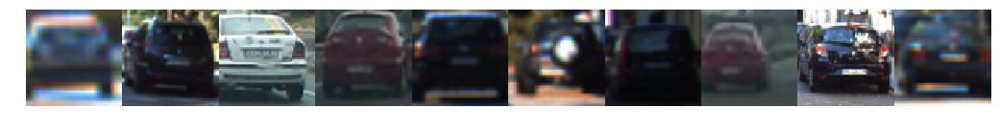

Original non vehicle images


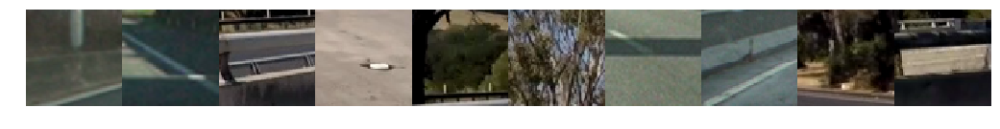

HSV vechile Bin


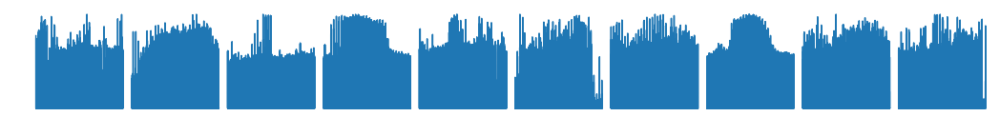

HSV Non vehicle Bin


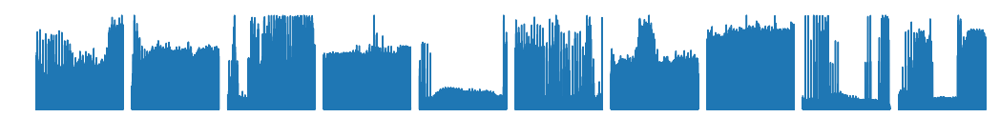

LUV Vehicle Bin


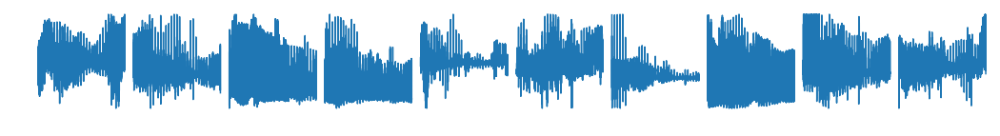

LUV Non Vehicle Bin


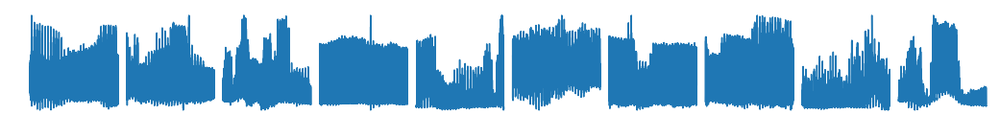

YUV Vehicle Bin


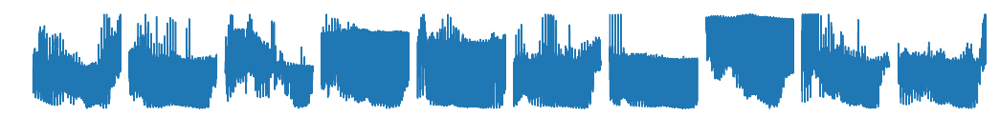

YUV Non Vehicle Bin


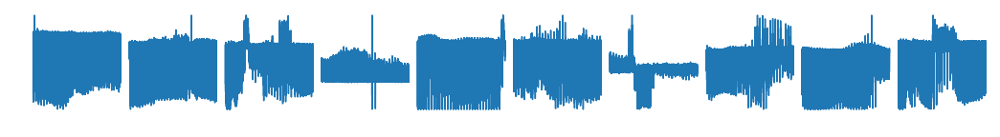

YCrCb Vehicle Bin


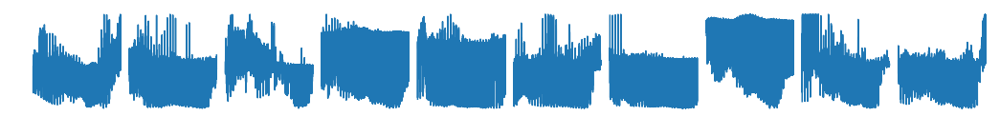

YCrCb Non Vehicle Bin


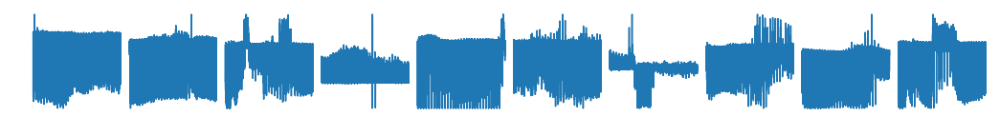

Done


In [14]:
hsv_bins = []
luv_bins = []
yuv_bins = []
ycrcb_bins = []

for image in random_vehicle_images:
    hsv = convert_color(image, color_space='HSV')
    hsv_bin = bin_spatial(hsv)
    luv = convert_color(image, color_space='LUV')
    luv_bin = bin_spatial(luv)
    yuv = convert_color(image, color_space='YUV')
    yuv_bin = bin_spatial(yuv)
    ycrcb = convert_color(image, color_space='YCrCb')
    ycrcb_bin = bin_spatial(ycrcb)
    
    hsv_bins.append(hsv_bin)
    luv_bins.append(luv_bin)
    yuv_bins.append(yuv_bin)
    ycrcb_bins.append(ycrcb_bin)

nhsv_bins = []
nluv_bins = []
nyuv_bins = []
nycrcb_bins = []

for image in random_non_vehicle_images:
    hsv = convert_color(image, color_space='HSV')
    nhsv_bin = bin_spatial(hsv)
    luv = convert_color(image, color_space='LUV')
    nluv_bin = bin_spatial(luv)
    yuv = convert_color(image, color_space='YUV')
    nyuv_bin = bin_spatial(yuv)
    ycrcb = convert_color(image, color_space='YCrCb')
    nycrcb_bin = bin_spatial(ycrcb)
    
    nhsv_bins.append(nhsv_bin)
    nluv_bins.append(nluv_bin)
    nyuv_bins.append(nyuv_bin)
    nycrcb_bins.append(nycrcb_bin)
print('Original vehicle images')
show_images(random_vehicle_images)
print('Original non vehicle images')
show_images(random_non_vehicle_images)
print('HSV vechile Bin')
plot_images(hsv_bins)
print('HSV Non vehicle Bin')
plot_images(nhsv_bins)
print('LUV Vehicle Bin')
plot_images(luv_bins)
print('LUV Non Vehicle Bin')
plot_images(nluv_bins)
print('YUV Vehicle Bin')
plot_images(yuv_bins)
print('YUV Non Vehicle Bin')
plot_images(nyuv_bins)
print('YCrCb Vehicle Bin')
plot_images(ycrcb_bins)
print('YCrCb Non Vehicle Bin')
plot_images(nycrcb_bins)
print('Done')

### Combine together

Let's combine the hog features, spatial and color histogram together on the extract_features() function. From the above experiment result, I choose the parameters: orient=9, pix_per_cell=8, cell_per_block=2 and color_space=LUV. The remain parameters will be choosen on some next experiments.

In [15]:
# Define a function to extract features from a list of images
# Have this function call bin_spatial() and color_hist()
def extract_features(imgs, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True):
    # Create a list to append feature vectors to
    features = []
    # Iterate through the list of images
    for image in imgs:
        file_features = []
        feature_image = convert_color(image, color_space=color_space)
        if spatial_feat == True:
            spatial_features = bin_spatial(feature_image, size=spatial_size)
            file_features.append(spatial_features)
        if hist_feat == True:
            # Apply color_hist()
            hist_features = color_hist(feature_image, nbins=hist_bins)
            file_features.append(hist_features)
        if hog_feat == True:
        # Call get_hog_features() with vis=False, feature_vec=True
            if hog_channel == 'ALL':
                hog_features = []
                for channel in range(feature_image.shape[2]):
                    hog_features.append(get_hog_features(feature_image[:,:,channel], 
                                        orient, pix_per_cell, cell_per_block, 
                                        vis=False, feature_vec=True))
                hog_features = np.ravel(hog_features)        
            else:
                hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                            pix_per_cell, cell_per_block, vis=False, feature_vec=True)
            # Append the new feature vector to the features list
            file_features.append(hog_features)
        features.append(np.concatenate(file_features))
    # Return list of feature vectors
    return features
print('Done')

Done


## Train a classifier

### Prepare training data
Load all vehicle and non vehicle images for later use.

In [16]:
# Load images function on a folder
def load_images(img_paths):
    imgs = []
    for img_path in img_paths:
        img = mpimg.imread(img_path)
        imgs.append(img)
    return imgs
# Load all vechile and non vehicle training images
vehicle_imgs = load_images(vehicle_image_paths)
non_vehicle_imgs = load_images(non_vehicle_image_paths)
print('Done')

Done


In [17]:
from sklearn.model_selection import train_test_split
from random import shuffle
import time
from sklearn.preprocessing import StandardScaler
# Prepare feature data function: extract hog features, histogram of color and spatial feature.
# Use StandardScaler to normalize data
# Shuffle the data to maximize the random on training
def prepare_feature_data(vehicle_imgs, non_vehicle_imgs, color_space='RGB', 
                        spatial_size=(16,16), hist_bins=16, 
                        orient=9, pix_per_cell=8, 
                        cell_per_block=2, 
                        hog_channel='ALL', spatial_feat=True, 
                        hist_feat=True, hog_feat=True):
    print('Color space:',color_space,'and',hog_channel,'Hog channel')
    print('Using orient of:',orient, 'and', pix_per_cell,'pix_per_cell','and',cell_per_block,'cell_per_block')
    print('Using spatial_size of:',spatial_size, 'and', hist_bins,'hist_bins')
    # Shuffle data
    shuffle(vehicle_imgs)
    shuffle(non_vehicle_imgs)
    # Load all vechile training images
    vehicle_features = extract_features(vehicle_imgs, color_space=color_space, spatial_size=spatial_size,
                        hist_bins=hist_bins, orient=orient, 
                        pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, hog_channel=hog_channel,
                        spatial_feat=spatial_feat, hist_feat=hist_feat, hog_feat=hog_feat)
    non_vehicle_features = extract_features(non_vehicle_imgs, color_space=color_space, spatial_size=spatial_size,
                        hist_bins=hist_bins, orient=orient, 
                        pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, hog_channel=hog_channel,
                        spatial_feat=spatial_feat, hist_feat=hist_feat, hog_feat=hog_feat)
    
    # Create an array stack of feature vectors
    X = np.vstack((vehicle_features, non_vehicle_features)).astype(np.float64)
    
     # Fit a per-column scaler
    X_scaler = StandardScaler().fit(X)
    # Apply the scaler to X
    scaled_X = X_scaler.transform(X)
    
    # Define the labels vector
    y = np.hstack((np.ones(len(vehicle_features)), np.zeros(len(non_vehicle_features))))
    
    # Split up data into randomized training and test sets
    rand_state = np.random.randint(0, 100)
    X_train, X_test, y_train, y_test = train_test_split(
        scaled_X, y, test_size=0.2, random_state=rand_state)
    
    return X_train, X_test, y_train, y_test, X_scaler
print('Done')

Done


### Train a classifier

The train classifier function use the linear SVC (Support Vector Classification).

In [18]:
from sklearn.svm import LinearSVC
def train_SVC(X_train, X_test, y_train, y_test):
    # Use a linear SVC 
    svc = LinearSVC()
    # Check the training time for the SVC
    t=time.time()
    svc.fit(X_train, y_train)
    t2 = time.time()
    print(round(t2-t, 2), 'Seconds to train SVC...')
    # Check the score of the SVC
    print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))
    # Check the prediction time for a single sample
    t=time.time()
    n_predict = 10
    print('My SVC predicts    : ', svc.predict(X_test[0:n_predict]))
    print('For these',n_predict, 'labels: ', y_test[0:n_predict])
    t2 = time.time()
    print(round(t2-t, 5), 'Seconds to predict', n_predict,'labels with SVC')
    return svc

Train the support vector classifier (SVC) with the LUV color space on L channel, orient=9, pix_per_cell=8, cell_per_block=2, spatial_size=(32,32) and hist_bins=16. It gives 98.14% accuracy on test dataset and 100% correction on 10 random prediction.

In [19]:
# Define parameters for feature extraction
color_space = 'LUV' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 9  # HOG orientations
pix_per_cell = 8 # HOG pixels per cell
cell_per_block = 2 # HOG cells per block
hog_channel = 0 # Can be 0, 1, 2, or "ALL"
spatial_size = (32, 32) # Spatial binning dimensions
hist_bins = 16    # Number of histogram bins
spatial_feat = True # Spatial features on or off
hist_feat = True # Histogram features on or off
hog_feat = True # HOG features on or off


X_train, X_test, y_train, y_test, X_scaler = prepare_feature_data(vehicle_imgs, non_vehicle_imgs, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)
svc = train_SVC(X_train, X_test, y_train, y_test)

Color space: LUV and 0 Hog channel
Using orient of: 9 and 8 pix_per_cell and 2 cell_per_block
Using spatial_size of: (32, 32) and 16 hist_bins


C:\Users\htang\AppData\Local\Continuum\Anaconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


15.13 Seconds to train SVC...
Test Accuracy of SVC =  0.9814
My SVC predicts    :  [ 0.  1.  1.  1.  0.  0.  0.  1.  0.  1.]
For these 10 labels:  [ 0.  1.  1.  1.  0.  0.  0.  1.  0.  1.]
0.00199 Seconds to predict 10 labels with SVC


Train the support vector classifier (SVC) with the LUV color space on L channel, orient=9, pix_per_cell=8, cell_per_block=2, spatial_size=(32,32) and hist_bins=32. It gives 98.11% accuracy on test dataset and 100% correction on 10 random prediction.

In [21]:
# Define parameters for feature extraction
color_space = 'LUV' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 9  # HOG orientations
pix_per_cell = 8 # HOG pixels per cell
cell_per_block = 2 # HOG cells per block
hog_channel = 0 # Can be 0, 1, 2, or "ALL"
spatial_size = (32, 32) # Spatial binning dimensions
hist_bins = 32    # Number of histogram bins
spatial_feat = True # Spatial features on or off
hist_feat = True # Histogram features on or off
hog_feat = True # HOG features on or off


X_train, X_test, y_train, y_test, X_scaler = prepare_feature_data(vehicle_imgs, non_vehicle_imgs, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)
svc = train_SVC(X_train, X_test, y_train, y_test)
print('Done')

Color space: LUV and 0 Hog channel
Using orient of: 9 and 8 pix_per_cell and 2 cell_per_block
Using spatial_size of: (32, 32) and 32 hist_bins


C:\Users\htang\AppData\Local\Continuum\Anaconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


15.47 Seconds to train SVC...
Test Accuracy of SVC =  0.9811
My SVC predicts    :  [ 0.  1.  0.  1.  1.  0.  1.  0.  0.  0.]
For these 10 labels:  [ 0.  1.  0.  1.  1.  0.  1.  0.  0.  0.]
0.001 Seconds to predict 10 labels with SVC
Done


Train the support vector classifier (SVC) with the LUV color space on ALL channels, orient=9, pix_per_cell=8, cell_per_block=2, spatial_size=(16,16) and hist_bins=16. It gives 98.31% accuracy on test dataset and 100% correction on 10 random prediction.

In [22]:
# Define parameters for feature extraction
color_space = 'LUV' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 9  # HOG orientations
pix_per_cell = 8 # HOG pixels per cell
cell_per_block = 2 # HOG cells per block
hog_channel = "ALL" # Can be 0, 1, 2, or "ALL"
spatial_size = (16, 16) # Spatial binning dimensions
hist_bins = 16    # Number of histogram bins
spatial_feat = True # Spatial features on or off
hist_feat = True # Histogram features on or off
hog_feat = True # HOG features on or off


X_train, X_test, y_train, y_test, X_scaler = prepare_feature_data(vehicle_imgs, non_vehicle_imgs, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)
svc = train_SVC(X_train, X_test, y_train, y_test)
print('Done')

Color space: LUV and ALL Hog channel
Using orient of: 9 and 8 pix_per_cell and 2 cell_per_block
Using spatial_size of: (16, 16) and 16 hist_bins


C:\Users\htang\AppData\Local\Continuum\Anaconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


19.68 Seconds to train SVC...
Test Accuracy of SVC =  0.9831
My SVC predicts    :  [ 1.  0.  1.  1.  1.  0.  0.  1.  0.  1.]
For these 10 labels:  [ 1.  0.  1.  1.  1.  0.  0.  1.  0.  1.]
0.001 Seconds to predict 10 labels with SVC
Done


## Sliding Window Search

### Same sliding window size search implementation

The draw_boxes function uses for drawing the result boxes on to the image

In [23]:
def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    # Make a copy of the image
    imcopy = np.copy(img)
    # Iterate through the bounding boxes
    for bbox in bboxes:
        # Draw a rectangle given bbox coordinates
        cv2.rectangle(imcopy, bbox[0], bbox[1], color, thick)
    # Return the image copy with boxes drawn
    return imcopy

In [24]:
# Define a function that takes an image,
# start and stop positions in both x and y, 
# window size (x and y dimensions),  
# and overlap fraction (for both x and y)
def slide_window(img, x_start_stop=[None, None], y_start_stop=[None, None], 
                    xy_window=(64, 64), xy_overlap=(0.5, 0.5)):
    # If x and/or y start/stop positions not defined, set to image size
    if x_start_stop[0] == None:
        x_start_stop[0] = 0
    if x_start_stop[1] == None:
        x_start_stop[1] = img.shape[1]
    if y_start_stop[0] == None:
        y_start_stop[0] = 0
    if y_start_stop[1] == None:
        y_start_stop[1] = img.shape[0]
    # Compute the span of the region to be searched    
    xspan = x_start_stop[1] - x_start_stop[0]
    yspan = y_start_stop[1] - y_start_stop[0]
    # Compute the number of pixels per step in x/y
    nx_pix_per_step = np.int(xy_window[0]*(1 - xy_overlap[0]))
    ny_pix_per_step = np.int(xy_window[1]*(1 - xy_overlap[1]))
    # Compute the number of windows in x/y
    nx_buffer = np.int(xy_window[0]*(xy_overlap[0]))
    ny_buffer = np.int(xy_window[1]*(xy_overlap[1]))
    nx_windows = np.int((xspan-nx_buffer)/nx_pix_per_step) 
    ny_windows = np.int((yspan-ny_buffer)/ny_pix_per_step) 
    # Initialize a list to append window positions to
    window_list = []
    # Loop through finding x and y window positions
    # Note: you could vectorize this step, but in practice
    # you'll be considering windows one by one with your
    # classifier, so looping makes sense
    for ys in range(ny_windows):
        for xs in range(nx_windows):
            # Calculate window position
            startx = xs*nx_pix_per_step + x_start_stop[0]
            endx = startx + xy_window[0]
            starty = ys*ny_pix_per_step + y_start_stop[0]
            endy = starty + xy_window[1]
            
            # Append window position to list
            window_list.append(((startx, starty), (endx, endy)))
    # Return the list of windows
    return window_list

In [25]:
# Define a function to extract features from a single image window
# This function is very similar to extract_features()
# just for a single image rather than list of images
def single_img_features(img, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True):    
    #1) Define an empty list to receive features
    img_features = []
    #2) Apply color conversion if other than 'RGB'
    feature_image = convert_color(img, color_space=color_space)  
    #3) Compute spatial features if flag is set
    if spatial_feat == True:
        spatial_features = bin_spatial(feature_image, size=spatial_size)
        #4) Append features to list
        img_features.append(spatial_features)
    #5) Compute histogram features if flag is set
    if hist_feat == True:
        hist_features = color_hist(feature_image, nbins=hist_bins)
        #6) Append features to list
        img_features.append(hist_features)
    #7) Compute HOG features if flag is set
    if hog_feat == True:
        if hog_channel == 'ALL':
            hog_features = []
            for channel in range(feature_image.shape[2]):
                hog_features.extend(get_hog_features(feature_image[:,:,channel], 
                                    orient, pix_per_cell, cell_per_block, 
                                    vis=False, feature_vec=True))      
        else:
            hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                        pix_per_cell, cell_per_block, vis=False, feature_vec=True)
        #8) Append features to list
        img_features.append(hog_features)

    #9) Return concatenated array of features
    return np.concatenate(img_features)

In [26]:
# Define a function you will pass an image 
# and the list of windows to be searched (output of slide_windows())
def search_windows(img, windows, clf, scaler, color_space='RGB', 
                    spatial_size=(32, 32), hist_bins=32, 
                    hist_range=(0, 256), orient=9, 
                    pix_per_cell=8, cell_per_block=2, 
                    hog_channel=0, spatial_feat=True, 
                    hist_feat=True, hog_feat=True):

    #1) Create an empty list to receive positive detection windows
    on_windows = []
    #2) Iterate over all windows in the list
    for idx, window in enumerate(windows):
        #3) Extract the test window from original image
        test_img = cv2.resize(img[window[0][1]:window[1][1], window[0][0]:window[1][0]], (64, 64))
        # Save image for debugging
        
        #cv2.imwrite('./data/test/{}.png'.format(idx), test_img )
        #4) Extract features for that window using single_img_features()
        features = single_img_features(test_img, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)
        #5) Scale extracted features to be fed to classifier
        test_features = scaler.transform(np.array(features).reshape(1, -1))
        #6) Predict using your classifier
        prediction = clf.predict(test_features)
        #7) If positive (prediction == 1) then save the window
        if prediction == 1:
            on_windows.append(window)
    #8) Return windows for positive detections
    return on_windows

Implement the find vehicle function using the same sliding windows size search algorithrm.

In [27]:
debug=True
def find_vehicles_same(image, svc, X_scaler, y_start_stop = [None, None], xy_window=(64, 64)):
    t=time.time()
    draw_image = np.copy(image)

    # Uncomment the following line if you extracted training
    # data from .png images (scaled 0 to 1 by mpimg) and the
    # image you are searching is a .jpg (scaled 0 to 255)
    image = image.astype(np.float32)/255
    windows = slide_window(image, x_start_stop=[0, image.shape[1]], y_start_stop=y_start_stop, 
                        xy_window=(64, 64), xy_overlap=(0.5, 0.5))

    hot_windows = search_windows(image, windows, svc, X_scaler, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)                       

    window_img = draw_boxes(draw_image, hot_windows, color=(0, 0, 255), thick=6)                    
    t2 = time.time()
    if debug:
        print(round(t2-t, 2), 'Seconds to find vehicles...')
    return window_img

In [28]:
# Load all test images
test_image_paths = glob.glob('./test_images/*.jpg')
test_images = []
for test_image_path in test_image_paths:
    test_image = mpimg.imread(test_image_path)
    test_images.append(test_image)
print('Done')

Done


In [29]:
# Define parameters for feature extraction
color_space = 'LUV' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 9  # HOG orientations
pix_per_cell = 8 # HOG pixels per cell
cell_per_block = 2 # HOG cells per block
hog_channel = "ALL" # Can be 0, 1, 2, or "ALL"
spatial_size = (32, 32) # Spatial binning dimensions
hist_bins = 32    # Number of histogram bins
spatial_feat = True # Spatial features on or off
hist_feat = True # Histogram features on or off
hog_feat = True # HOG features on or off


X_train, X_test, y_train, y_test, X_scaler = prepare_feature_data(vehicle_imgs, non_vehicle_imgs, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)
svc = train_SVC(X_train, X_test, y_train, y_test)
print('Done')

Color space: LUV and ALL Hog channel
Using orient of: 9 and 8 pix_per_cell and 2 cell_per_block
Using spatial_size of: (32, 32) and 32 hist_bins


C:\Users\htang\AppData\Local\Continuum\Anaconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


26.46 Seconds to train SVC...
Test Accuracy of SVC =  0.9842
My SVC predicts    :  [ 1.  1.  1.  1.  0.  0.  0.  1.  0.  0.]
For these 10 labels:  [ 1.  1.  1.  1.  0.  0.  0.  0.  0.  0.]
0.00098 Seconds to predict 10 labels with SVC
Done


The SVC with the LUV color space on ALL channels give a very good result on accuracy with 98.42% correction however it gives a not good result on test images with some white car cannot detect.

C:\Users\htang\AppData\Local\Continuum\Anaconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


1.46 Seconds to find vehicles...


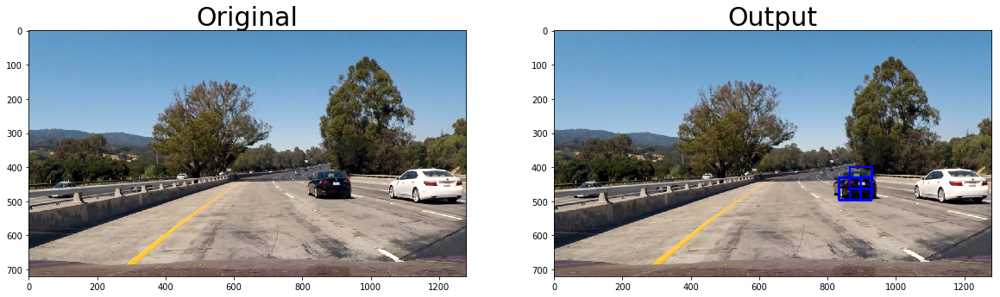

1.32 Seconds to find vehicles...


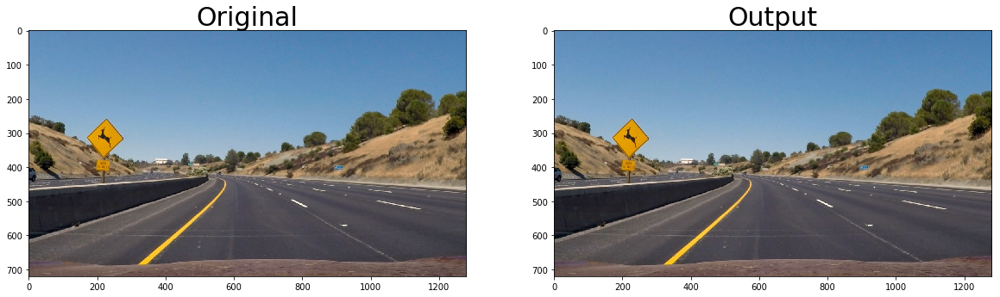

1.33 Seconds to find vehicles...


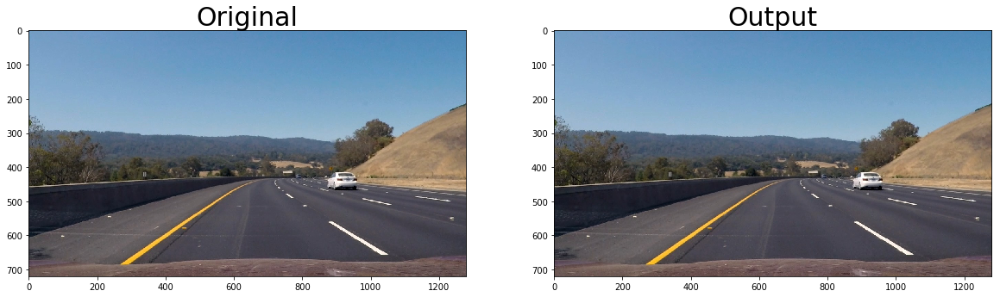

1.29 Seconds to find vehicles...


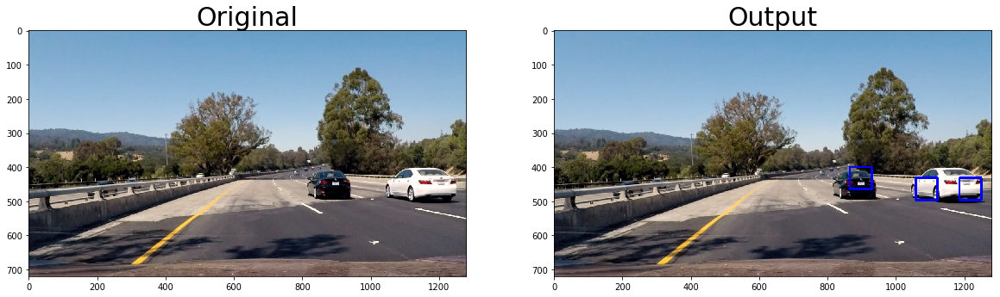

1.39 Seconds to find vehicles...


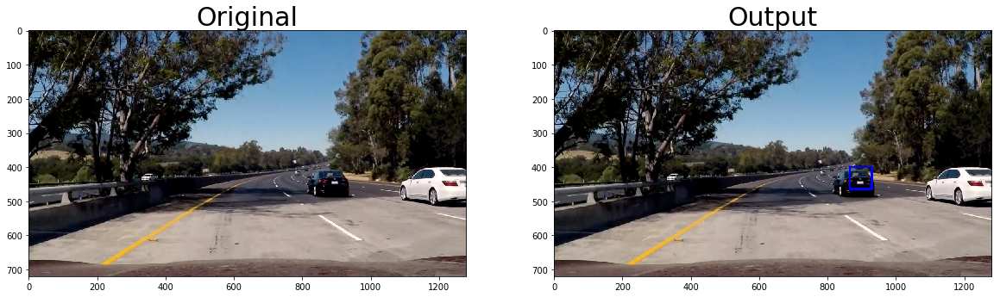

1.39 Seconds to find vehicles...


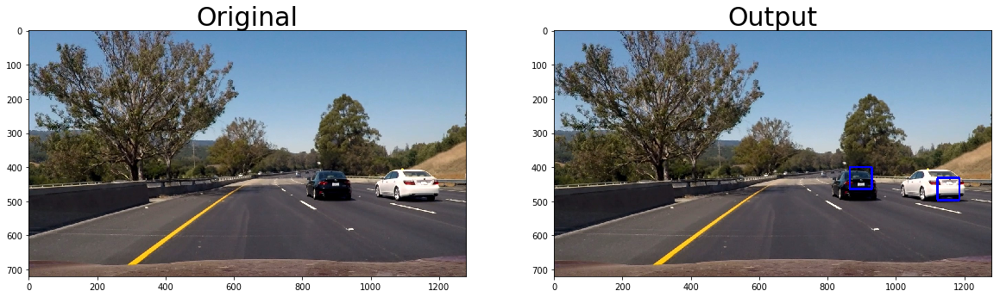

In [30]:
# Test find vehicles on test images
for img in test_images:
    y_start_stop=[400, img.shape[0] - 20]
    out_img = find_vehicles_same(img, svc, X_scaler, y_start_stop = y_start_stop, xy_window=(64, 64))
    show2images(img, 'Original', out_img, 'Output')

In [31]:
# Define parameters for feature extraction
color_space = 'LUV' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 9  # HOG orientations
pix_per_cell = 8 # HOG pixels per cell
cell_per_block = 2 # HOG cells per block
hog_channel = 0 # Can be 0, 1, 2, or "ALL"
spatial_size = (32, 32) # Spatial binning dimensions
hist_bins = 32    # Number of histogram bins
spatial_feat = True # Spatial features on or off
hist_feat = True # Histogram features on or off
hog_feat = True # HOG features on or off


X_train, X_test, y_train, y_test, X_scaler = prepare_feature_data(vehicle_imgs, non_vehicle_imgs, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)
svc = train_SVC(X_train, X_test, y_train, y_test)

Color space: LUV and 0 Hog channel
Using orient of: 9 and 8 pix_per_cell and 2 cell_per_block
Using spatial_size of: (32, 32) and 32 hist_bins


C:\Users\htang\AppData\Local\Continuum\Anaconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


14.81 Seconds to train SVC...
Test Accuracy of SVC =  0.9817
My SVC predicts    :  [ 1.  0.  0.  1.  0.  0.  0.  0.  1.  1.]
For these 10 labels:  [ 1.  0.  0.  1.  0.  0.  0.  0.  1.  1.]
0.00099 Seconds to predict 10 labels with SVC


The SVC training with LUV color space on the L channel also give a good accuracy 98.17% and it can give a good result on test images with all cars are detected with some false detections. It takes about 0.60 seconds to detect vehicles on a test image.

C:\Users\htang\AppData\Local\Continuum\Anaconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


0.58 Seconds to find vehicles...


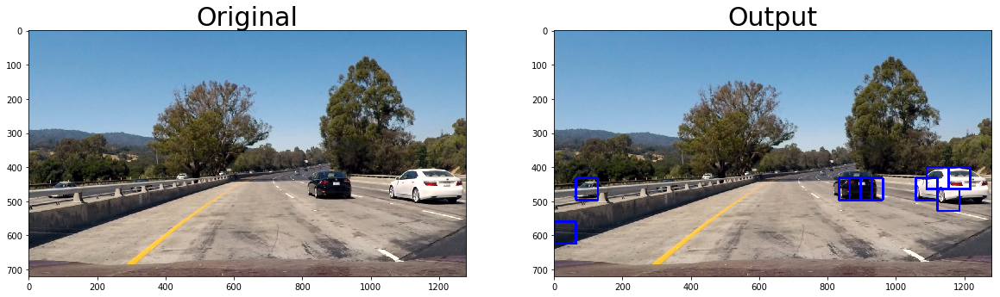

0.55 Seconds to find vehicles...


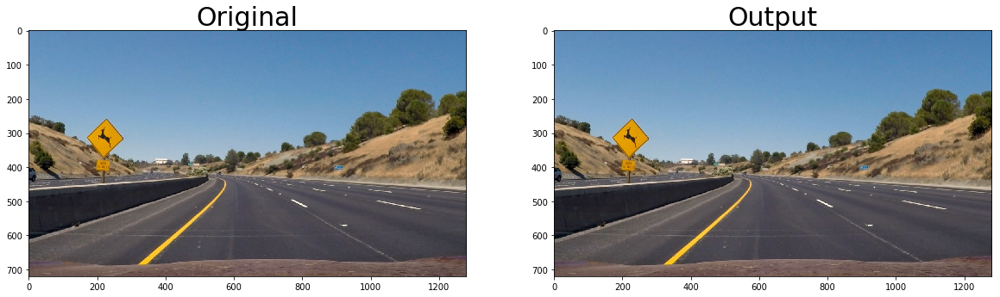

0.55 Seconds to find vehicles...


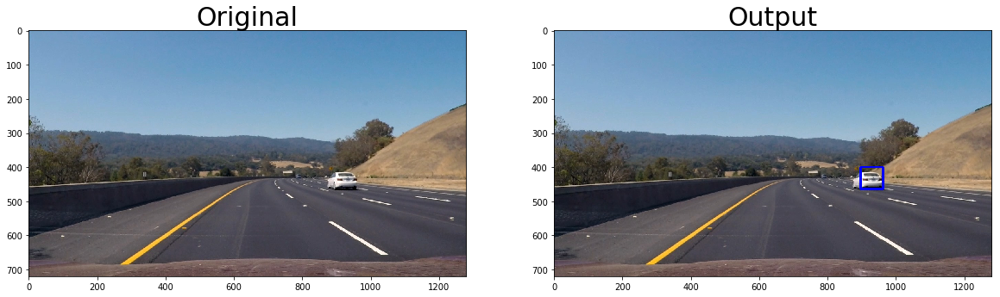

0.54 Seconds to find vehicles...


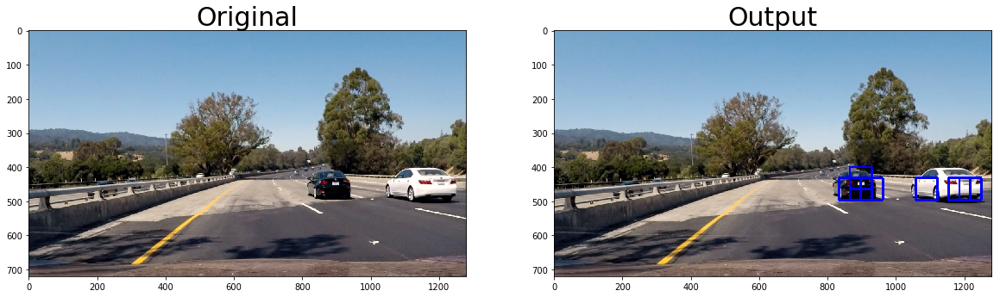

0.54 Seconds to find vehicles...


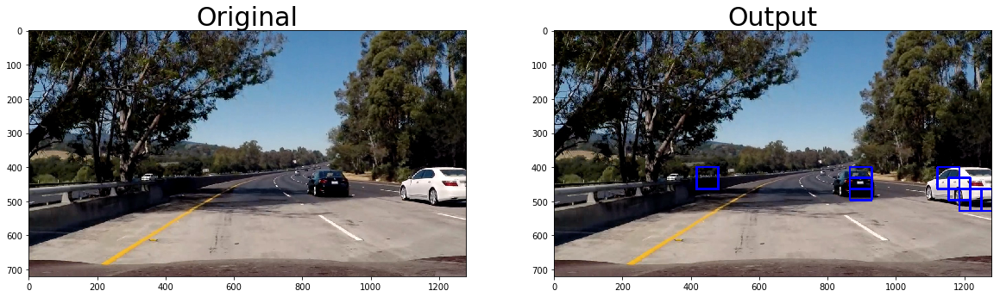

0.58 Seconds to find vehicles...


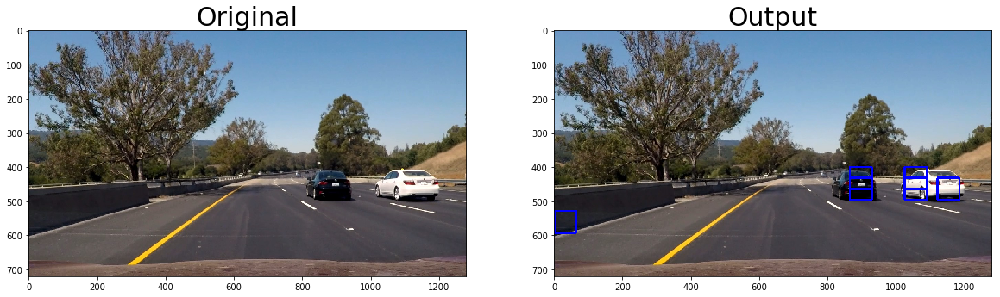

In [32]:
# Test find vehicles on test images
for img in test_images:
    y_start_stop=[400, img.shape[0] - 20]
    out_img = find_vehicles_same(img, svc, X_scaler, y_start_stop = y_start_stop, xy_window=(64, 64))
    show2images(img, 'Original', out_img, 'Output')

### Multi scale sliding window search

It's easy to regconize that the car appears on the image with different size based on their location. So in order to improve the search performance, I implement the slide window search with multiple scale.

In [33]:
# Define a function that takes an image,
# start and stop positions in both x and y, 
# window size (x and y dimensions),  
# and overlap fraction (for both x and y)
# y_start_stop=[400, image.shape[0]]
def slide_multi_scales_window(img, x_regions=([None, None],[None,None]), y_regions=([400, 528], [528, None]), 
                    xy_windows=([64, 64], [128,128]), xy_overlap=(0.5, 0.5)):
    # Initialize a list to append window positions to
    window_list = []
    for idx, y_region in enumerate(y_regions):
        x_region = x_regions[idx]
        if x_region[0] == None:
            x_region[0] = 0
        if x_region[1] == None:
            x_region[1] = img.shape[1]
        if y_region[0] == None:
            y_region[0] = 0
        if y_region[1] == None:
            y_region[1] = img.shape[0]
        # Compute the span of the region to be searched    
        xspan = x_region[1] - x_region[0]
        yspan = y_region[1] - y_region[0]
        xy_window = xy_windows[idx]
        # Compute the number of pixels per step in x/y
        nx_pix_per_step = np.int(xy_window[0]*(1 - xy_overlap[0]))
        ny_pix_per_step = np.int(xy_window[1]*(1 - xy_overlap[1]))
        # Compute the number of windows in x/y
        nx_buffer = np.int(xy_window[0]*(xy_overlap[0]))
        ny_buffer = np.int(xy_window[1]*(xy_overlap[1]))
        nx_windows = np.int((xspan-nx_buffer)/nx_pix_per_step) 
        ny_windows = np.int((yspan-ny_buffer)/ny_pix_per_step)
        
        # Loop through finding x and y window positions
        # Note: you could vectorize this step, but in practice
        # you'll be considering windows one by one with your
        # classifier, so looping makes sense
        for ys in range(ny_windows):
            for xs in range(nx_windows):
                # Calculate window position
                startx = xs*nx_pix_per_step + x_region[0]
                endx = startx + xy_window[0]
                starty = ys*ny_pix_per_step + y_region[0]
                endy = starty + xy_window[1]

                # Append window position to list
                window_list.append(((startx, starty), (endx, endy)))
    
    # Return the list of windows
    return window_list


In [34]:
debug = True
def find_vehicles_multi(image, svc, X_scaler, x_regions=([None, None],[None,None]), 
                  y_regions=([400, 528], [528, None]), xy_windows=([64, 64], [128,128]), 
                        xy_overlap=(0.5, 0.5), draw_windows=True):
    t=time.time()
    
    
    draw_image = np.copy(image)

    # Uncomment the following line if you extracted training
    # data from .png images (scaled 0 to 1 by mpimg) and the
    # image you are searching is a .jpg (scaled 0 to 255)
    image = image.astype(np.float32)/255
    windows = slide_multi_scales_window(img, x_regions=x_regions, y_regions=y_regions, 
                    xy_windows=xy_windows, xy_overlap=xy_overlap)

    hot_windows = search_windows(image, windows, svc, X_scaler, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)                       

    t2 = time.time()
    if debug:
        print(round(t2-t, 2), 'Seconds to find vehicles...')
    if draw_windows:
        window_img = draw_boxes(draw_image, hot_windows, color=(0, 0, 255), thick=6)
        return window_img, hot_windows
    else:
        return hot_windows
print('Done')

Done


It gives the better result with only 0.30 seconds to detect vehicles on a test image.

C:\Users\htang\AppData\Local\Continuum\Anaconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


0.29 Seconds to find vehicles...


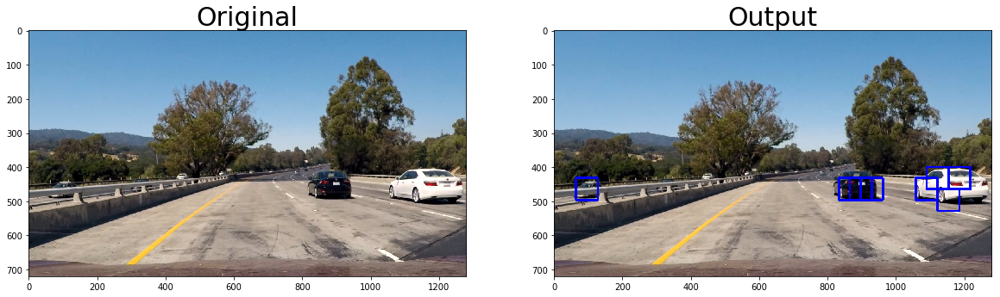

0.28 Seconds to find vehicles...


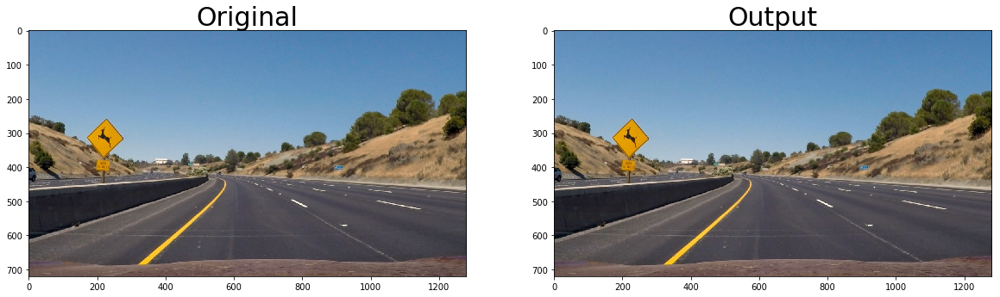

0.28 Seconds to find vehicles...


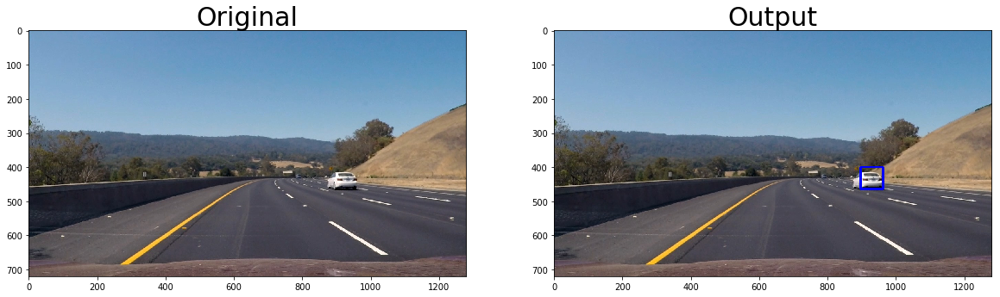

0.29 Seconds to find vehicles...


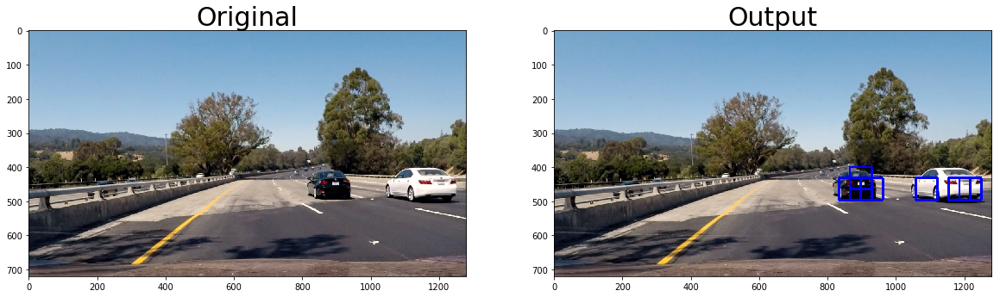

0.29 Seconds to find vehicles...


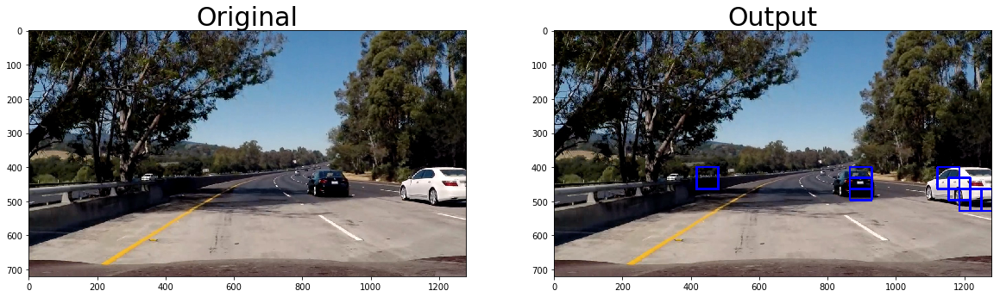

0.3 Seconds to find vehicles...


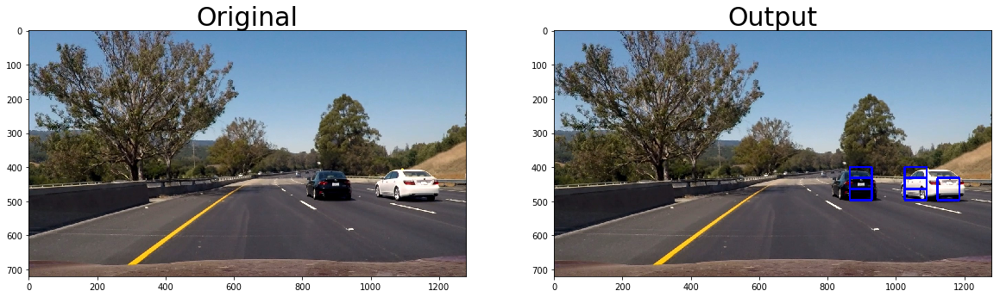

In [35]:
# Test find vehicles on test images
for img in test_images:
    out_img, hot_windows = find_vehicles_multi(img, svc, X_scaler, x_regions=([None, None],[None,None]), 
                  y_regions=([400, 528], [528, None]), xy_windows=([64, 64], [128,128]), xy_overlap=(0.5, 0.5))
    show2images(img, 'Original', out_img, 'Output')

C:\Users\htang\AppData\Local\Continuum\Anaconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


0.36 Seconds to find vehicles...


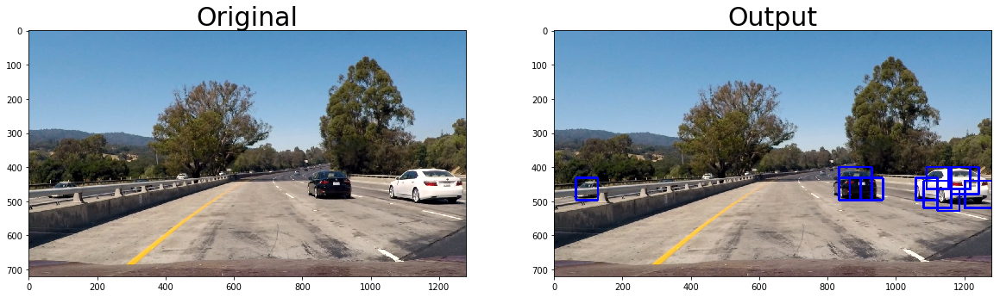

0.35 Seconds to find vehicles...


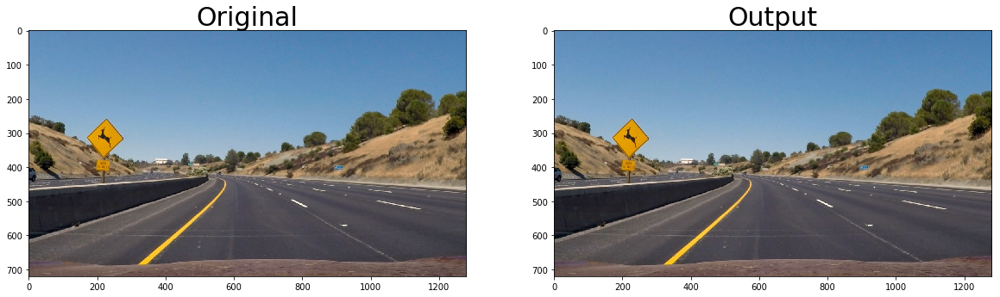

0.34 Seconds to find vehicles...


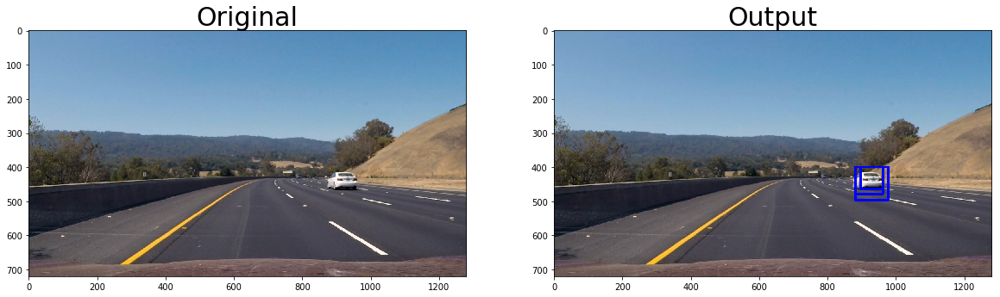

0.37 Seconds to find vehicles...


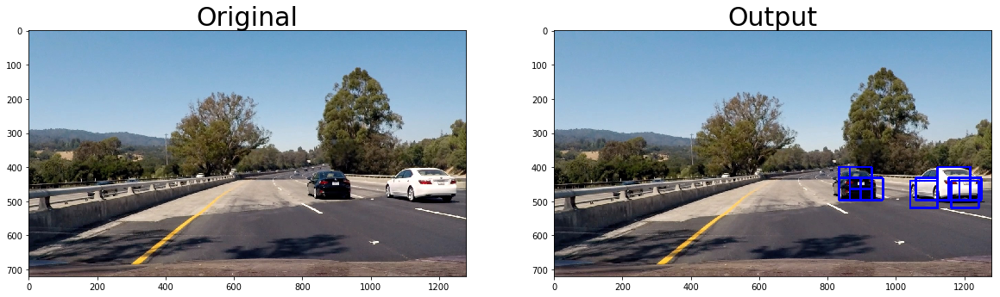

0.41 Seconds to find vehicles...


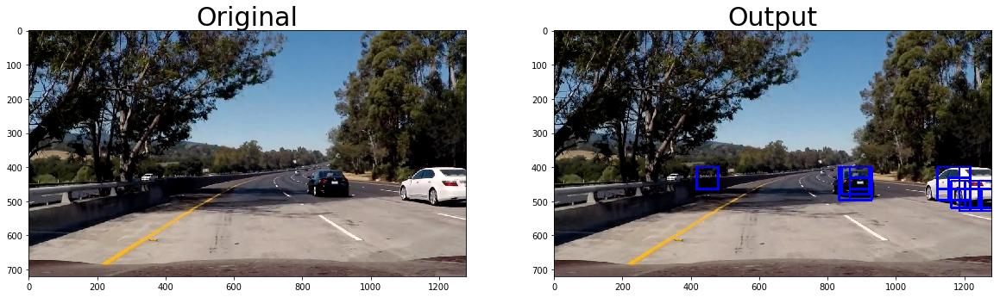

0.38 Seconds to find vehicles...


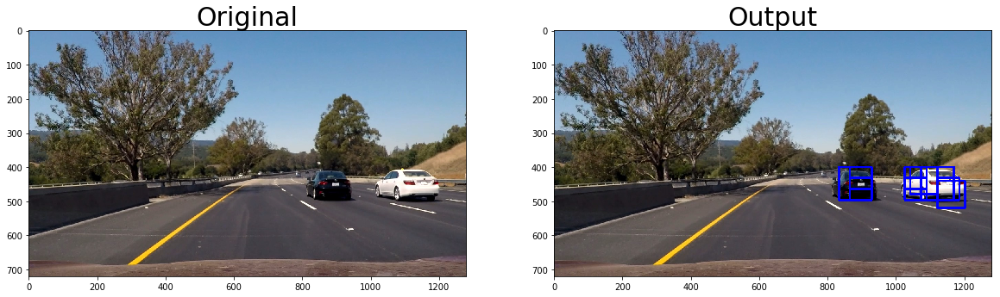

In [36]:
# Test find vehicles on test images
for img in test_images:
    out_img, hot_windows = find_vehicles_multi(img, svc, X_scaler, x_regions=([None, None],[400,None],[400,None],[None,None]), 
                  y_regions=([400, 528], [400, 528], [400, 528], [528, 680]), xy_windows=([64, 64], [80,80], [96,96], [128,128]), xy_overlap=(0.5, 0.5))
    show2images(img, 'Original', out_img, 'Output')

### Multiple detection and false positives

C:\Users\htang\AppData\Local\Continuum\Anaconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


0.37 Seconds to find vehicles...


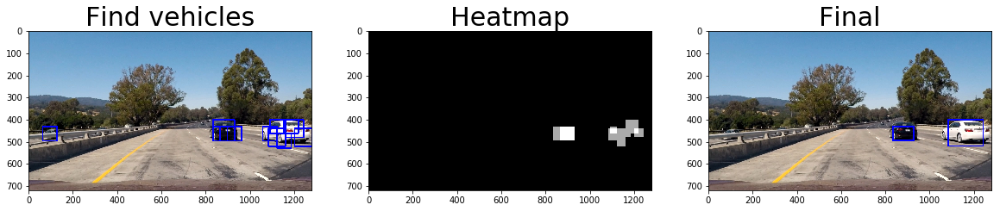

0.34 Seconds to find vehicles...


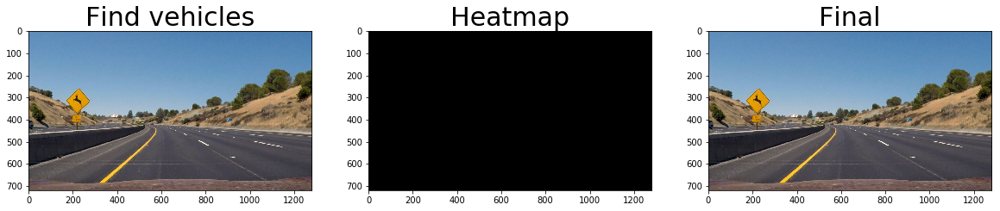

0.34 Seconds to find vehicles...


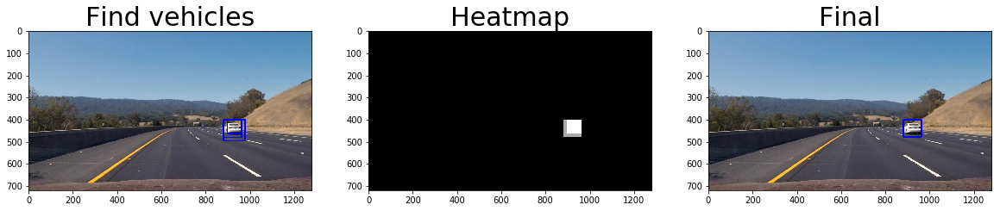

0.36 Seconds to find vehicles...


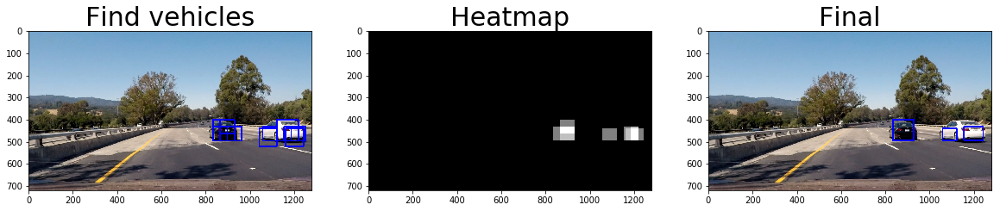

0.34 Seconds to find vehicles...


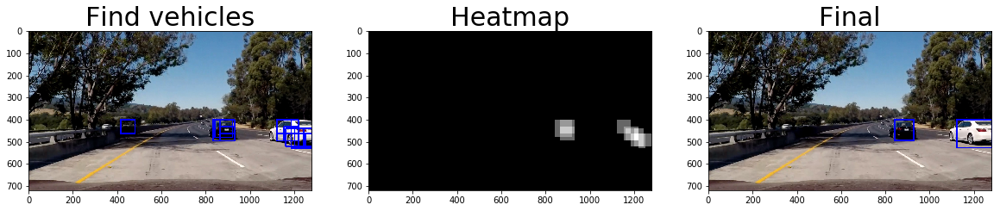

0.34 Seconds to find vehicles...


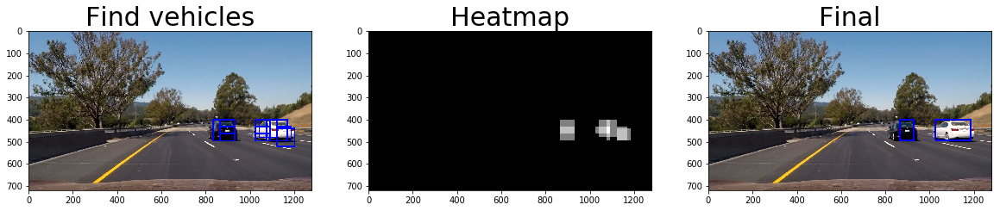

In [37]:
from scipy.ndimage.measurements import label

def add_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    # Return updated heatmap
    return heatmap# Iterate through list of bboxes
    
def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap

def draw_labeled_bboxes(img, labels):
    # Iterate through all detected cars
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 6)
    # Return the image
    return img

def filter_by_heatmap(img, box_list, threshold=1 ):
    heat = np.zeros_like(img[:,:,0]).astype(np.float)
    # Add heat to each box in box list
    heat = add_heat(heat,box_list)

    # Apply threshold to help remove false positives
    heat = apply_threshold(heat,threshold)

    # Visualize the heatmap when displaying    
    heatmap = np.clip(heat, 0, 255)

    # Find final boxes from heatmap using label function
    labels = label(heatmap)
    return heatmap,labels

# Test find vehicles on test images
for img in test_images:
    out_img, hot_windows = find_vehicles_multi(img, svc, X_scaler, x_regions=([None, None],[400,None],[400,None],[None,None]), 
                  y_regions=([400, 528], [400, 528], [400, 528], [528, 680]), xy_windows=([64, 64], [80,80], [96,96], [128,128]), xy_overlap=(0.5, 0.5))
    heatmap, labels = filter_by_heatmap(img,hot_windows,threshold=1)
    draw_img = draw_labeled_bboxes(np.copy(img), labels)
    
    show3images(out_img, 'Find vehicles', heatmap, 'Heatmap', draw_img, 'Final')

C:\Users\htang\AppData\Local\Continuum\Anaconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


0.36 Seconds to find vehicles...


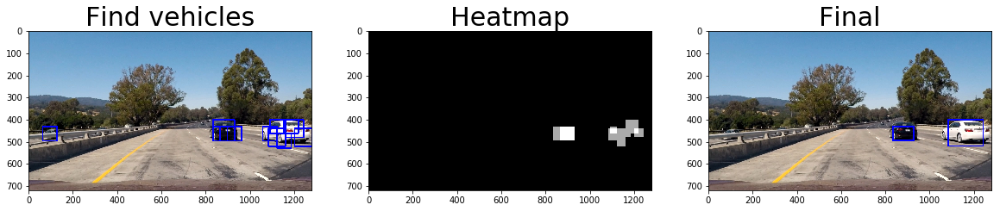

0.37 Seconds to find vehicles...


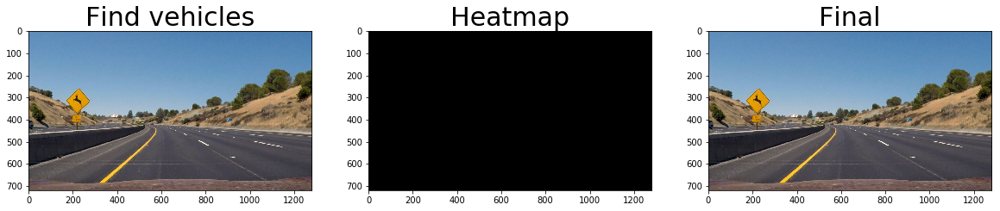

0.37 Seconds to find vehicles...


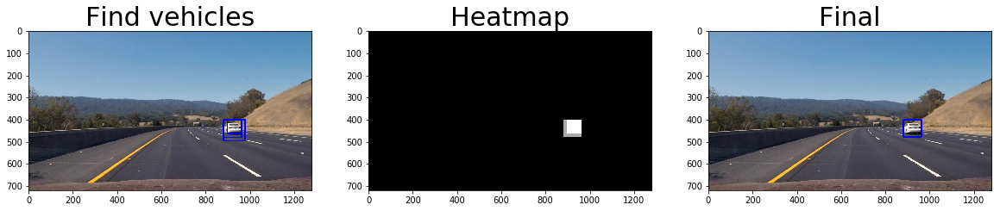

0.36 Seconds to find vehicles...


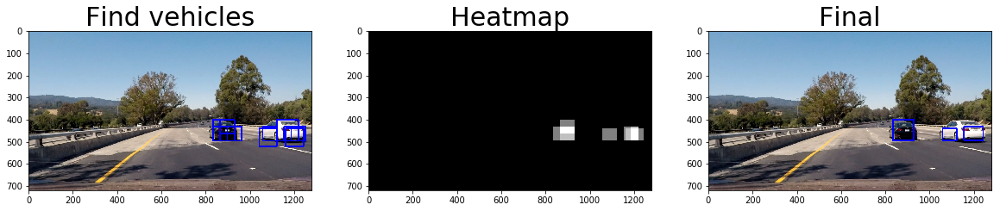

0.34 Seconds to find vehicles...


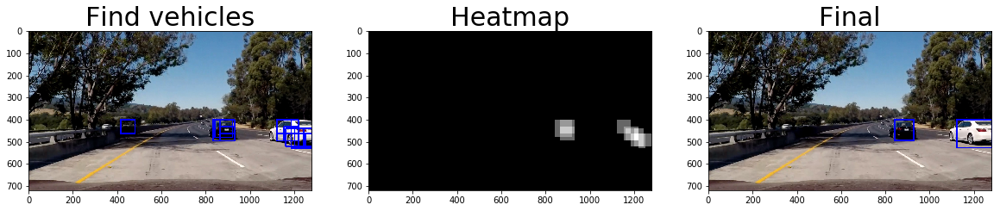

0.38 Seconds to find vehicles...


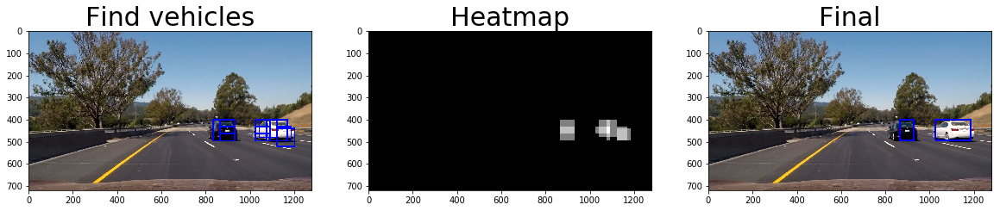

In [38]:
# Test find vehicles on test images
for img in test_images:
    out_img, hot_windows = find_vehicles_multi(img, svc, X_scaler, x_regions=([None, None],[400,None],[400,None],[None,None]), 
                  y_regions=([400, 528], [400, 528], [400, 528], [528, 680]), xy_windows=([64, 64], [80,80], [96,96], [128,128]), xy_overlap=(0.5, 0.5))
    heatmap, labels = filter_by_heatmap(img,hot_windows,threshold=1)
    draw_img = draw_labeled_bboxes(np.copy(img), labels)
    
    show3images(out_img, 'Find vehicles', heatmap, 'Heatmap', draw_img, 'Final')

## Put all together

### Define a class to store vehicle detections history

The Vehicle_Detect_History class use to store the detection hot windows on video frames with the maximum size. It will be use for apply the heat map and threshold in order to give the better detection and eliminate false positives.

In [39]:
class Vehicle_Detect_History:
    def __init__(self):
        self.hot_windows = []
        self.maximum = 15
        
    def add_hot_windows(self, windows):
        self.hot_windows.append(windows)
        if (len(self.hot_windows) > self.maximum):
            # remove the oldest one
            del self.hot_windows[0]

## Video implementation

In [40]:
def add_heatmap(img, box_lists, threshold=1 ):
    heat = np.zeros_like(img[:,:,0]).astype(np.float)
    for box_list in box_lists:
        # Add heat to each box in box list
        heat = add_heat(heat,box_list)

    # Apply threshold to help remove false positives
    heat = apply_threshold(heat,threshold)

    # Visualize the heatmap when displaying    
    heatmap = np.clip(heat, 0, 255)

    # Find final boxes from heatmap using label function
    labels = label(heatmap)
    return heatmap,labels

In [41]:
debug=False
def process_img(img):
    hot_windows = find_vehicles_multi(img, svc, X_scaler, x_regions=([None, None],[400,None],[400,None],[None,None]), 
                  y_regions=([400, 528], [400, 528], [400, 528], [528, 680]), 
                  xy_windows=([64, 64], [80,80], [96,96], [128,128]), xy_overlap=(0.5, 0.5), draw_windows=False)
    if (len(hot_windows) > 0):
        vdh.add_hot_windows(hot_windows)
    threshold = len(vdh.hot_windows)
    if threshold >= vdh.maximum:
        threshold = threshold - 3
    heatmap, labels = add_heatmap(img,vdh.hot_windows,threshold=threshold)
    draw_img = draw_labeled_bboxes(np.copy(img), labels)
    return draw_img

In [42]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML
vdh = Vehicle_Detect_History()
test_out_file = 'test_video_out.mp4'
clip_test = VideoFileClip('test_video.mp4')
clip_test_out = clip_test.fl_image(process_img)
%time clip_test_out.write_videofile(test_out_file, audio=False)

[MoviePy] >>>> Building video test_video_out.mp4
[MoviePy] Writing video test_video_out.mp4


 97%|███████████████████████████████████████████████████████████████████████████████▉  | 38/39 [00:14<00:00,  2.71it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_video_out.mp4 

Wall time: 14.9 s


In [43]:
from IPython.display import HTML
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(test_out_file))

In [44]:
debug = False
vdh = Vehicle_Detect_History()
project_out_file = 'project_video_out.mp4'
project_video = VideoFileClip('project_video.mp4')
project_video_out = project_video.fl_image(process_img)
%time project_video_out.write_videofile(project_out_file, audio=False)

[MoviePy] >>>> Building video project_video_out.mp4
[MoviePy] Writing video project_video_out.mp4


100%|█████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [07:38<00:00,  2.72it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_out.mp4 

Wall time: 7min 39s


In [45]:
from IPython.display import HTML
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(project_out_file))

### Combine with advanced lane finding

In [46]:
import laneline
video_input1 = VideoFileClip('project_video_out.mp4')
video_output = "project_video_out_lane.mp4"
processed_video = video_input1.fl_image(lambda img:laneline.process_lane(img))
%time processed_video.write_videofile(video_output, audio=False)


[MoviePy] >>>> Building video project_video_out_lane.mp4
[MoviePy] Writing video project_video_out_lane.mp4


100%|█████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [02:00<00:00,  8.98it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_out_lane.mp4 

Wall time: 2min


In [47]:
from IPython.display import HTML
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(video_output))